# Basic Imports and Initial Data Exploration 

In [ ]:
import matplotlib
import numpy as np
from google.colab import files
import seaborn as sns
import matplotlib.pyplot as plt 
import pandas as pd  
from datetime import datetime
from calendar import day_name



In [ ]:
uploaded = files.upload()
for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving bank_traffic_data.csv to bank_traffic_data.csv
User uploaded file "bank_traffic_data.csv" with length 318122 bytes


In [ ]:
bankRawData = pd.read_csv("bank_traffic_data.csv")

In [ ]:
bankRawData.head()

,timestamp,count,window
0,2019-09-26 02:00:00+02:00,764,1
1,2019-09-27 02:00:00+02:00,0,1
2,2019-09-28 02:00:00+02:00,0,1
3,2019-09-29 02:00:00+02:00,1973,1
4,2019-09-30 02:00:00+02:00,1908,1


In [ ]:
bankRawData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10013 entries, 0 to 10012
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   timestamp  10013 non-null  object
 1   count      10013 non-null  int64 
 2   window     10013 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 234.8+ KB


In [ ]:
bankRawData['window'].value_counts()

15    675
7     675
14    675
6     675
13    675
12    675
11    675
3     675
10    675
2     675
1     675
8     675
4     640
5     639
9     634
Name: window, dtype: int64

# Feature Engineering 

In [ ]:
type (bankRawData['timestamp'][0])

str

In [ ]:
# Creating a column with timestamp being a python datetime object 
bankRawData['dateTime'] =  pd.to_datetime(bankRawData['timestamp'], infer_datetime_format=True)

In [ ]:
bankRawData.head()

,timestamp,count,window,dateTime
0,2019-09-26 02:00:00+02:00,764,1,2019-09-26 02:00:00+02:00
1,2019-09-27 02:00:00+02:00,0,1,2019-09-27 02:00:00+02:00
2,2019-09-28 02:00:00+02:00,0,1,2019-09-28 02:00:00+02:00
3,2019-09-29 02:00:00+02:00,1973,1,2019-09-29 02:00:00+02:00
4,2019-09-30 02:00:00+02:00,1908,1,2019-09-30 02:00:00+02:00


In [ ]:
# Creating a Feature to represent the Date Day Encoding 
bankRawData['weekDayInt'] = bankRawData['dateTime'].apply(lambda x: x.dayofweek) # Monday Day 0 
bankRawData['weekDayCalender'] = bankRawData['weekDayInt'].apply(lambda x: day_name[x])

In [ ]:
bankRawData.head()

,timestamp,count,window,dateTime,weekDayInt,weekDayCalender
0,2019-09-26 02:00:00+02:00,764,1,2019-09-26 02:00:00+02:00,3,Thursday
1,2019-09-27 02:00:00+02:00,0,1,2019-09-27 02:00:00+02:00,4,Friday
2,2019-09-28 02:00:00+02:00,0,1,2019-09-28 02:00:00+02:00,5,Saturday
3,2019-09-29 02:00:00+02:00,1973,1,2019-09-29 02:00:00+02:00,6,Sunday
4,2019-09-30 02:00:00+02:00,1908,1,2019-09-30 02:00:00+02:00,0,Monday


In [ ]:
bankRawData[bankRawData['timestamp']=='2019-09-26 02:00:00+02:00']


,timestamp,count,window,dateTime,weekDayInt,weekDayCalender
0,2019-09-26 02:00:00+02:00,764,1,2019-09-26 02:00:00+02:00,3,Thursday
675,2019-09-26 02:00:00+02:00,320,2,2019-09-26 02:00:00+02:00,3,Thursday
1350,2019-09-26 02:00:00+02:00,113,3,2019-09-26 02:00:00+02:00,3,Thursday
2025,2019-09-26 02:00:00+02:00,101,4,2019-09-26 02:00:00+02:00,3,Thursday
2665,2019-09-26 02:00:00+02:00,101,5,2019-09-26 02:00:00+02:00,3,Thursday
3304,2019-09-26 02:00:00+02:00,104,6,2019-09-26 02:00:00+02:00,3,Thursday
3979,2019-09-26 02:00:00+02:00,119,7,2019-09-26 02:00:00+02:00,3,Thursday
4654,2019-09-26 02:00:00+02:00,109,8,2019-09-26 02:00:00+02:00,3,Thursday
5329,2019-09-26 02:00:00+02:00,113,9,2019-09-26 02:00:00+02:00,3,Thursday
5963,2019-09-26 02:00:00+02:00,118,10,2019-09-26 02:00:00+02:00,3,Thursday


In [ ]:
holidays_2020 = ['2020-01-01',
 '2020-01-07',
 '2020-01-25',
 '2020-03-12',
 '2020-04-19',
 '2020-04-20',
 '2020-04-25',
 '2020-05-01',
 '2020-05-02',
 '2020-05-24',
 '2020-05-25',
 '2020-05-26',
 '2020-05-27',
 '2020-05-28',
 '2020-06-30',
 '2020-07-23',
 '2020-07-31',
 '2020-08-01',
 '2020-08-02',
 '2020-08-03',
 '2020-08-20',
'2020-10-08',
'2020-10-29',

 ]




In [ ]:
 holidays_2021 = ['2021-01-07',
 '2021-01-28',
 '2021-04-29',
 '2021-05-01',
 '2021-05-02',
 '2021-05-03',
 '2021-05-12',
 '2021-05-13',
 '2021-05-14',
 '2021-05-15',
 '2021-05-16',
 '2021-07-01',
 '2021-07-17',
 '2021-07-18',
 '2021-07-19',
 '2021-07-20',
 '2021-07-21',
 '2021-07-22',
 '2021-07-23',
 '2021-07-24',
 '2021-08-12',
 '2021-10-07',
 '2021-10-21']

 

In [ ]:
holidays_2020 =  [datetime.strptime(date, '%Y-%m-%d').date() for date in holidays_2020]
holidays_2021 =  [datetime.strptime(date, '%Y-%m-%d').date() for date in holidays_2021]

In [ ]:
bankRawData['isOfficial'] = bankRawData['dateTime'].apply ( lambda x : x.date()). apply ( lambda x : 1 if (( x in holidays_2020) or (x in holidays_2021)) else 0 )

In [ ]:
bankRawData[bankRawData['isOfficial']== 1]

,timestamp,count,window,dateTime,weekDayInt,weekDayCalender,isOfficial
97,2020-01-01 02:00:00+02:00,1231,1,2020-01-01 02:00:00+02:00,2,Wednesday,1
103,2020-01-07 02:00:00+02:00,0,1,2020-01-07 02:00:00+02:00,1,Tuesday,1
121,2020-01-25 02:00:00+02:00,0,1,2020-01-25 02:00:00+02:00,5,Saturday,1
168,2020-03-12 02:00:00+02:00,0,1,2020-03-12 02:00:00+02:00,3,Thursday,1
206,2020-04-19 02:00:00+02:00,0,1,2020-04-19 02:00:00+02:00,6,Sunday,1
...,...,...,...,...,...,...,...
10001,2021-07-20 02:00:00+02:00,0,15,2021-07-20 02:00:00+02:00,1,Tuesday,1
10002,2021-07-21 02:00:00+02:00,0,15,2021-07-21 02:00:00+02:00,2,Wednesday,1
10003,2021-07-22 02:00:00+02:00,0,15,2021-07-22 02:00:00+02:00,3,Thursday,1
10004,2021-07-23 02:00:00+02:00,0,15,2021-07-23 02:00:00+02:00,4,Friday,1


# EDA and Descriptive Analytics

## Holiday Analysis 

we are investigating here the days that have zero traffic. our hypothesis is that they are: 

weekends in Egypt have zero traffic : Saturday & Friday 
Official Holidays in Egypt. 

In [ ]:
bankDataDate = bankRawData[['count', 'dateTime' , 'isOfficial', 'weekDayCalender']]

In [ ]:
bankDataDate.head()

,count,dateTime,isOfficial,weekDayCalender
0,764,2019-09-26 02:00:00+02:00,0,Thursday
1,0,2019-09-27 02:00:00+02:00,0,Friday
2,0,2019-09-28 02:00:00+02:00,0,Saturday
3,1973,2019-09-29 02:00:00+02:00,0,Sunday
4,1908,2019-09-30 02:00:00+02:00,0,Monday


In [ ]:
bankDataDateAggregated = bankDataDate.groupby(['dateTime' , 'weekDayCalender']).agg('sum')
bankDataZero = bankDataDateAggregated[bankDataDateAggregated['count']==0]

In [ ]:
bankDataZero.reset_index(inplace=  True)
bankDataDateAggregated.reset_index(inplace=True)

In [ ]:
bankDataZero.head()

,dateTime,weekDayCalender,count,isOfficial
0,2019-09-27 02:00:00+02:00,Friday,0,0
1,2019-09-28 02:00:00+02:00,Saturday,0,0
2,2019-10-04 02:00:00+02:00,Friday,0,0
3,2019-10-05 02:00:00+02:00,Saturday,0,0
4,2019-10-11 02:00:00+02:00,Friday,0,0


In [ ]:
bankDataZero.count()

dateTime           234
weekDayCalender    234
count              234
isOfficial         234
dtype: int64

In [ ]:
bankDataDateAggregated['weekDayCalender'].value_counts()

Friday       97
Saturday     97
Thursday     97
Monday       96
Tuesday      96
Sunday       96
Wednesday    96
Name: weekDayCalender, dtype: int64

In [ ]:
print( "Friday count: ", bankDataZero[bankDataZero['weekDayCalender']=="Friday"].count())
print ("Saturday count: " ,  bankDataZero[bankDataZero['weekDayCalender']=="Saturday"].count())

Friday count:  dateTime           97
weekDayCalender    97
count              97
isOfficial         97
dtype: int64
Saturday count:  dateTime           97
weekDayCalender    97
count              97
isOfficial         97
dtype: int64


we currently have a clear data driven insight that all **Fridays** and **Saturdays** will have 0 traffic since it is the Egyptian weekend. however, we have other 0 count days that are worth investigation. maybe they are official holidays? 

In [ ]:
bankDataHoliday =  bankDataZero[(bankDataZero['weekDayCalender'] != 'Friday')   & (bankDataZero['weekDayCalender'] != 'Saturday')]  

In [ ]:
bankDataHoliday.reset_index(inplace=True , drop=True)

In [ ]:
# investigate the days with zero count 

bankDataHoliday['weekDayCalender'].value_counts()
#bankData_zeroCount['weekDayCalender'].value_counts()

Thursday     13
Monday        8
Sunday        8
Wednesday     6
Tuesday       5
Name: weekDayCalender, dtype: int64

In [ ]:
#dividing the Holiday data frame to two dataframes one for 2020 & one for 2021 since they have different Holiday days (following the Islamic and coptic calenders)


bankDataHoliday2020 = bankDataHoliday[bankDataHoliday['dateTime'].apply (lambda x:x.year) == 2020]
bankDataHoliday2021 = bankDataHoliday[bankDataHoliday['dateTime'].apply (lambda x:x.year) == 2021]

In [ ]:
bankDataHoliday2020.reset_index(inplace=True , drop=True)
bankDataHoliday2021.reset_index(inplace=True , drop=True)


In [ ]:
bankDataHoliday2020

,dateTime,weekDayCalender,count,isOfficial
0,2020-01-07 02:00:00+02:00,Tuesday,0,15
1,2020-03-12 02:00:00+02:00,Thursday,0,15
2,2020-04-16 02:00:00+02:00,Thursday,0,0
3,2020-04-19 02:00:00+02:00,Sunday,0,15
4,2020-04-20 02:00:00+02:00,Monday,0,15
5,2020-05-24 02:00:00+02:00,Sunday,0,15
6,2020-05-25 02:00:00+02:00,Monday,0,15
7,2020-05-26 02:00:00+02:00,Tuesday,0,15
8,2020-05-27 02:00:00+02:00,Wednesday,0,15
9,2020-05-28 02:00:00+02:00,Thursday,0,15


In [ ]:
bankDataHoliday2021

,dateTime,weekDayCalender,count,isOfficial
0,2021-01-07 02:00:00+02:00,Thursday,0,15
1,2021-01-25 02:00:00+02:00,Monday,0,0
2,2021-01-28 02:00:00+02:00,Thursday,0,15
3,2021-03-29 02:00:00+02:00,Monday,0,0
4,2021-04-25 02:00:00+02:00,Sunday,0,0
5,2021-04-29 02:00:00+02:00,Thursday,0,15
6,2021-05-02 02:00:00+02:00,Sunday,0,15
7,2021-05-03 02:00:00+02:00,Monday,0,15
8,2021-05-12 02:00:00+02:00,Wednesday,0,15
9,2021-05-13 02:00:00+02:00,Thursday,0,15


we found that the days that the bank traffic was closed in that are not either a saturday or sundays are mostly official holidays. however, there are somepoints that had zero traffic, but were not official holidays. After Further Investigation. we found that these points were mainly due to the decision of Egypt's prime minister that mid-week official holidays will be shifted to a thursday in order to have a long weekend. in some cases, it is clear in the data that both days were off as well (the original + the thursday of this week) 

# Data Exploration and Visualization 

## Plotting the time series for each window 


In [ ]:
windows=[]
for i in range(1,16):
  windows.append( bankRawData[bankRawData['window']==i])


In [ ]:
windows[0]

,timestamp,count,window,dateTime,weekDayInt,weekDayCalender,isOfficial
0,2019-09-26 02:00:00+02:00,764,1,2019-09-26 02:00:00+02:00,3,Thursday,0
1,2019-09-27 02:00:00+02:00,0,1,2019-09-27 02:00:00+02:00,4,Friday,0
2,2019-09-28 02:00:00+02:00,0,1,2019-09-28 02:00:00+02:00,5,Saturday,0
3,2019-09-29 02:00:00+02:00,1973,1,2019-09-29 02:00:00+02:00,6,Sunday,0
4,2019-09-30 02:00:00+02:00,1908,1,2019-09-30 02:00:00+02:00,0,Monday,0
...,...,...,...,...,...,...,...
670,2021-07-27 02:00:00+02:00,2886,1,2021-07-27 02:00:00+02:00,1,Tuesday,0
671,2021-07-28 02:00:00+02:00,1907,1,2021-07-28 02:00:00+02:00,2,Wednesday,0
672,2021-07-29 02:00:00+02:00,2169,1,2021-07-29 02:00:00+02:00,3,Thursday,0
673,2021-07-30 02:00:00+02:00,0,1,2021-07-30 02:00:00+02:00,4,Friday,0


In [ ]:
'''
fix , ax = plt.subplots(4,4,figsize=(30,20))
ax.flatten()
for i in range(0,4):
  for j in range(0,4):
    ax[i][j].set_title(f'[window {i * 4 + j + 1}] vs time')
    ax[i][j]
    ax[i][j].plot(windows[i * 4 + j ]['dateTime'] ,windows[i * 4 + j]['count']  , color='k')
'''




"\nfix , ax = plt.subplots(4,4,figsize=(30,20))\nax.flatten()\nfor i in range(0,4):\n  for j in range(0,4):\n    ax[i][j].set_title(f'[window {i * 4 + j + 1}] vs time')\n    ax[i][j]\n    ax[i][j].plot(windows[i * 4 + j ]['dateTime'] ,windows[i * 4 + j]['count']  , color='k')\n"

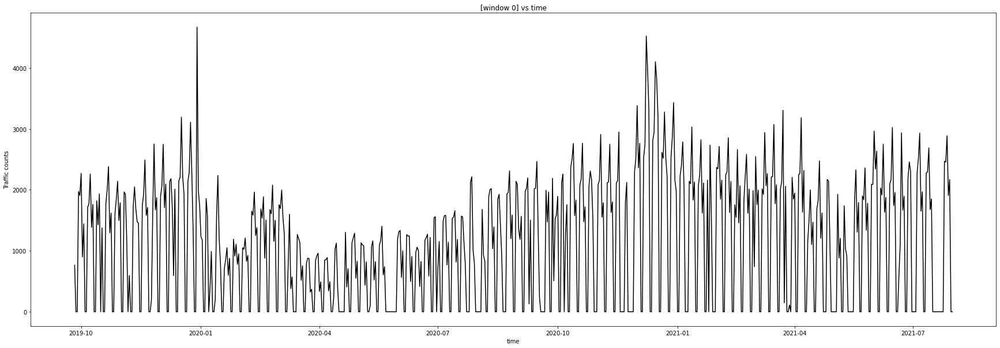

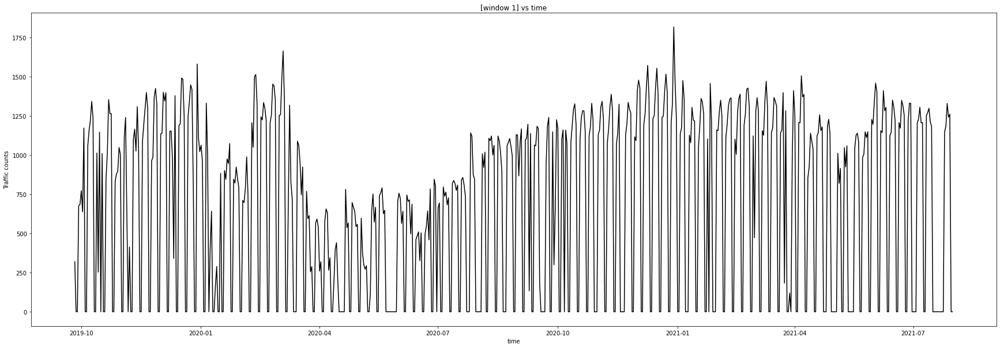

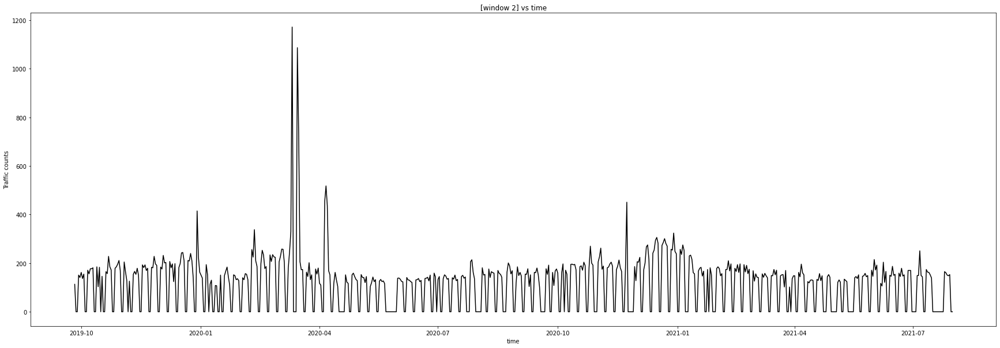

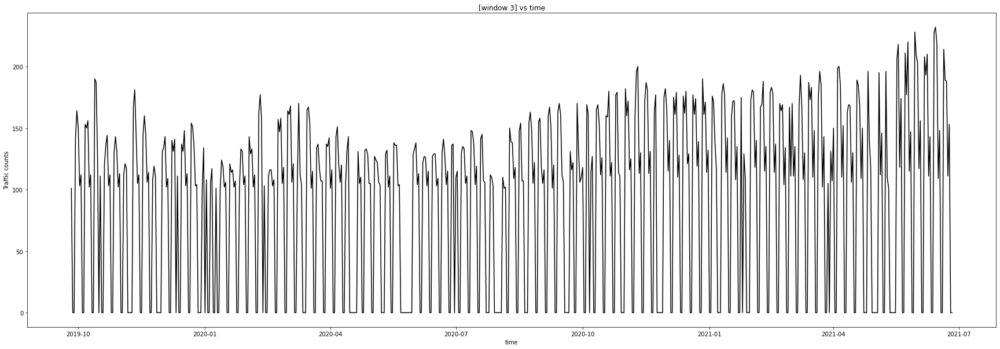

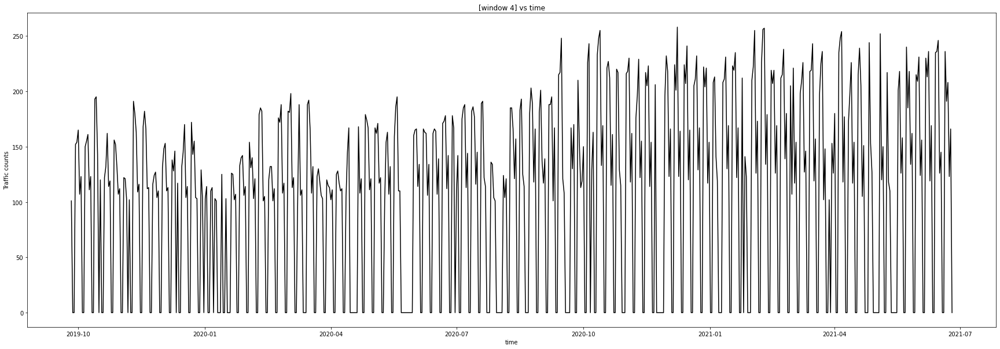

...

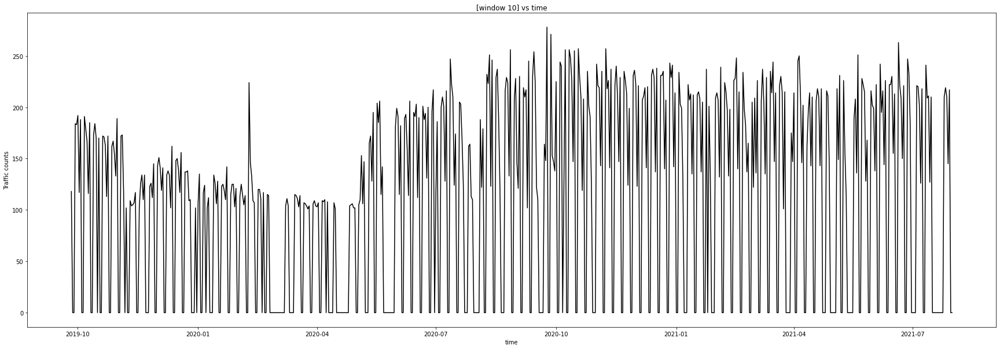

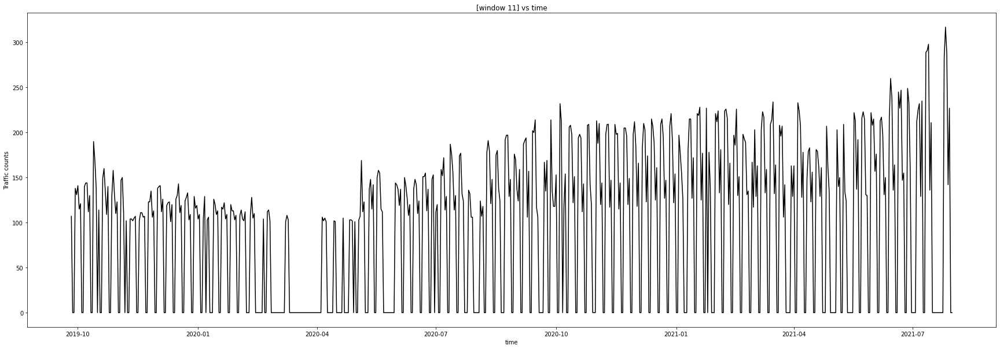

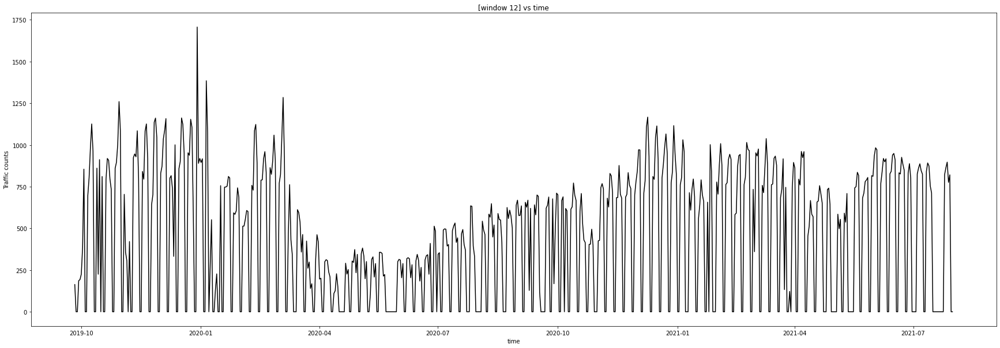

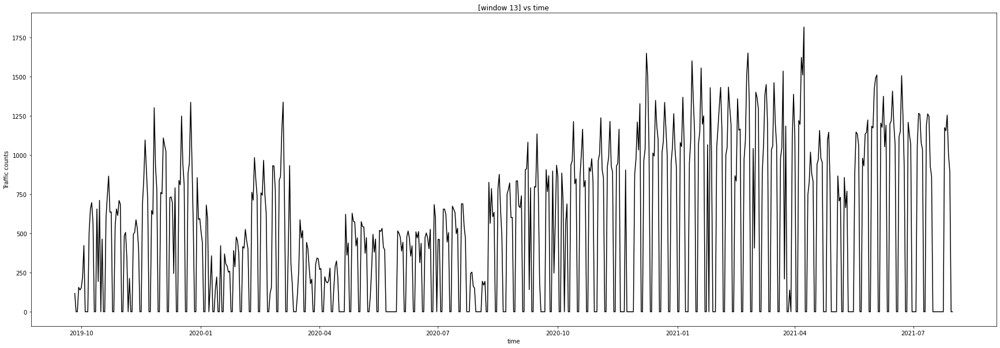

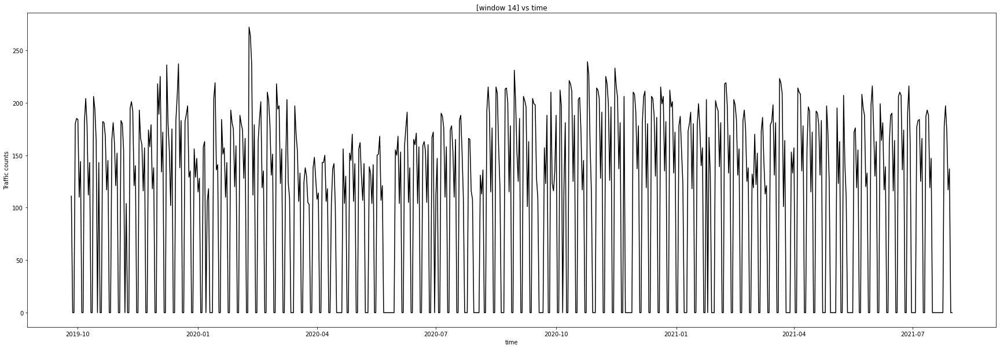

In [ ]:
for i in range(0,15):
  plt.figure(figsize=(25,10))
  plt.title(f'[window {i+1}] vs time')
  plt.xlabel('time')
  plt.ylabel('Traffic counts')
  plt.plot(windows[i]['dateTime'] ,windows[i]['count']  , color='k')

## Doing the same analysis on windows without 0 days

In [ ]:
windows_noZero = []
for window in windows:
  windows_noZero.append(window [window['count'] != 0])

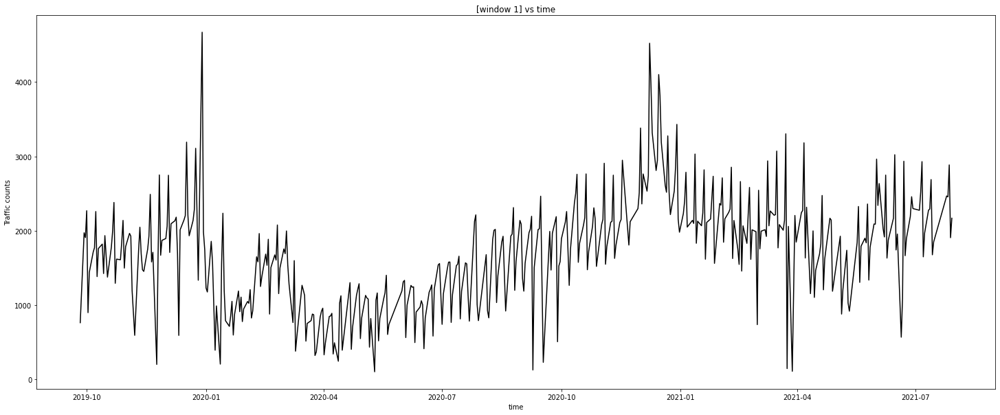

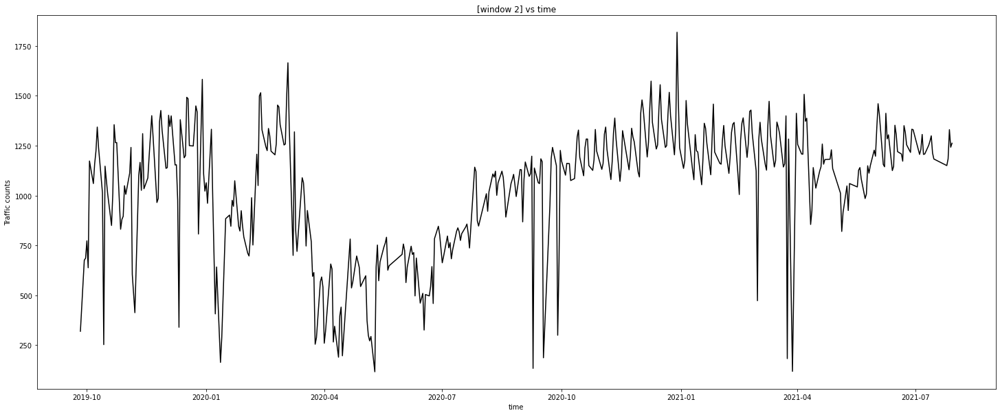

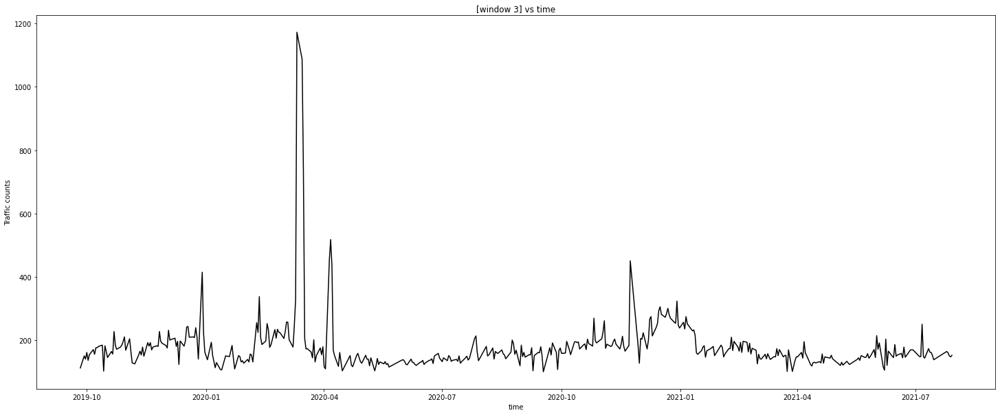

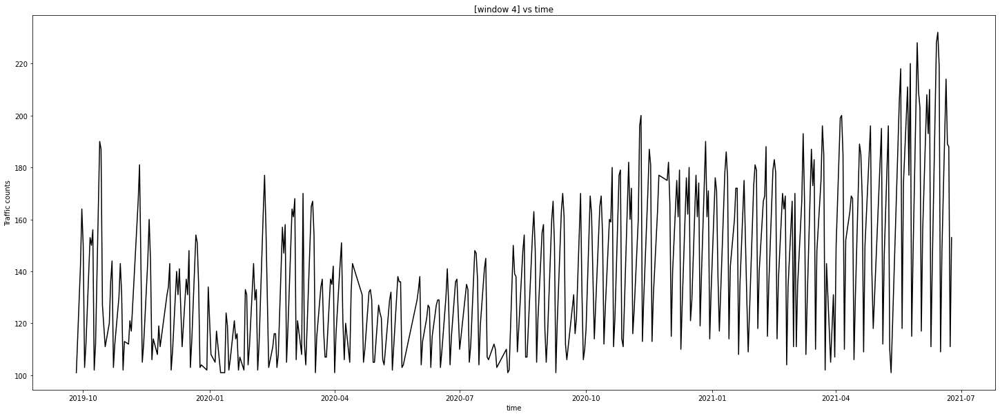

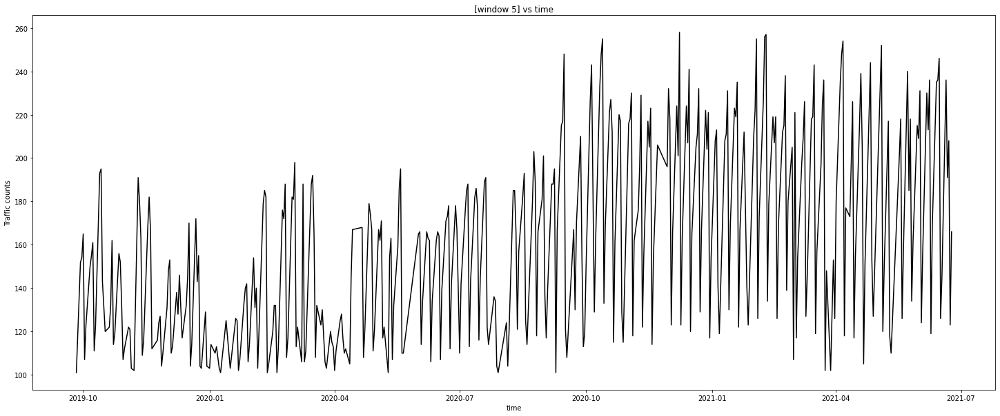

...

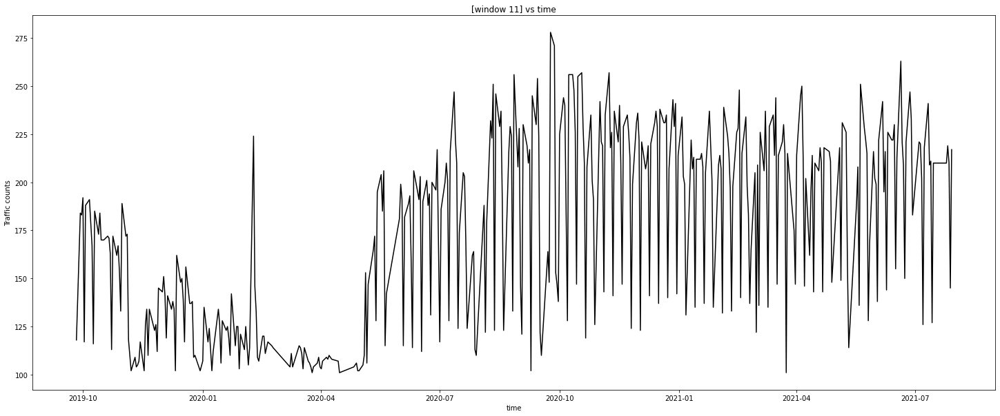

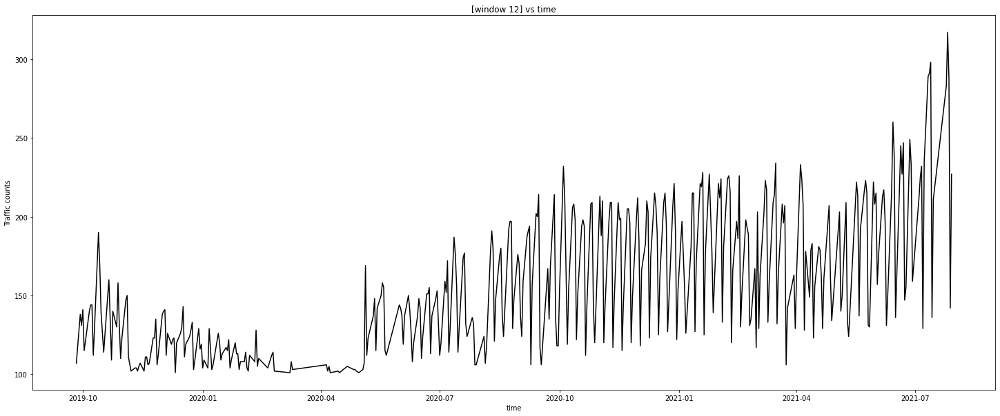

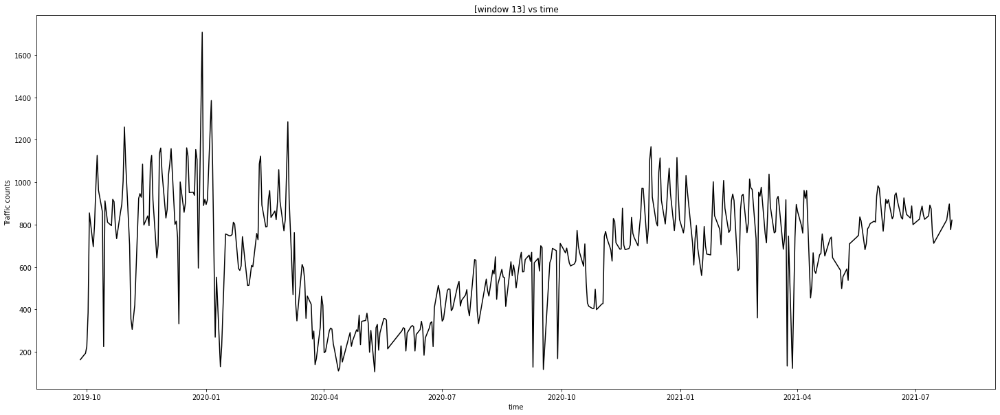

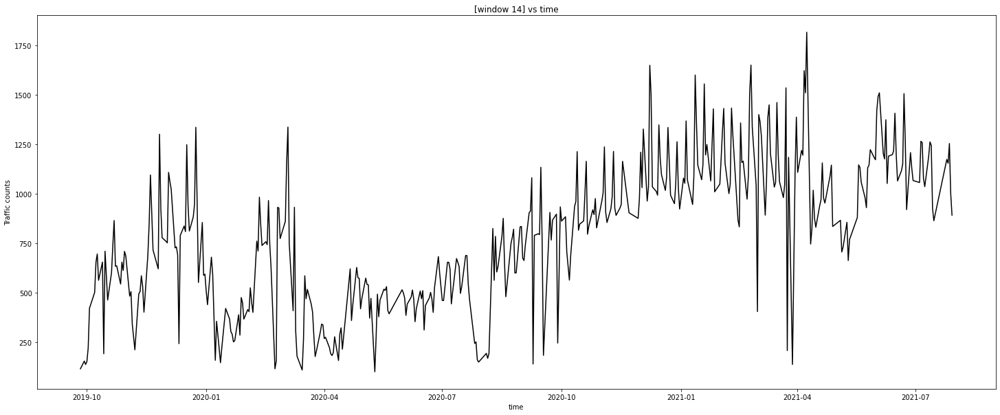

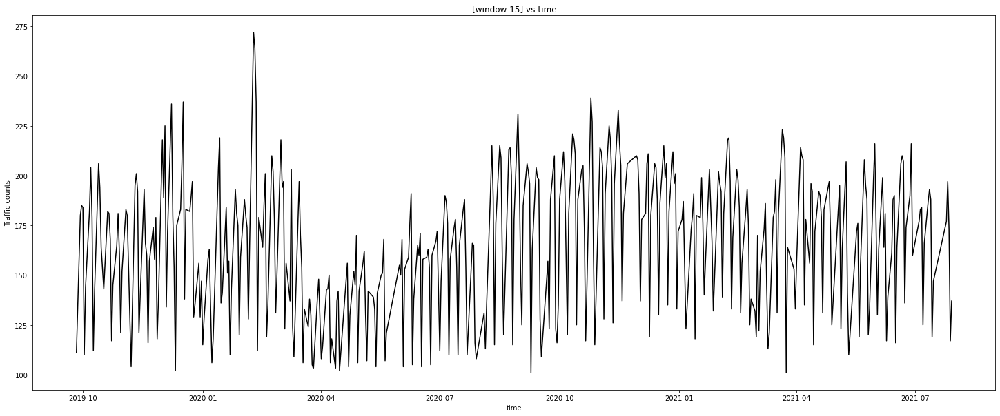

In [ ]:
for i in range(0,15):
  plt.figure(figsize=(25,10))
  plt.title(f'[window {i+1}] vs time')
  plt.xlabel('time')
  plt.ylabel('Traffic counts')
  plt.plot(windows_noZero[i]['dateTime'] ,windows_noZero[i]['count']  , color='k')

In [ ]:
window_1[window_1['dateTime']== '2020-03-01 02:00:00+02:00']  # The start of Covid Era 

,timestamp,count,window,dateTime,weekDayInt,weekDayCalender,isOfficial
157,2020-03-01 02:00:00+02:00,1756,1,2020-03-01 02:00:00+02:00,6,Sunday,0


## Plotting the time series for the Total Traffic 


In [ ]:
bankDataTotal = bankRawData.groupby('dateTime').agg('sum')

In [ ]:
bankDataTotal.head()

,count,window,weekDayInt,isOfficial
dateTime,,,,
2019-09-26 02:00:00+02:00,2578,120,45,0
2019-09-27 02:00:00+02:00,0,120,60,0
2019-09-28 02:00:00+02:00,0,120,75,0
2019-09-29 02:00:00+02:00,4704,120,90,0
2019-09-30 02:00:00+02:00,4805,120,0,0


In [ ]:
bankDataTotal.reset_index(inplace=True )


In [ ]:
bankDataTotal.head()

,dateTime,count,window,weekDayInt,isOfficial
0,2019-09-26 02:00:00+02:00,2578,120,45,0
1,2019-09-27 02:00:00+02:00,0,120,60,0
2,2019-09-28 02:00:00+02:00,0,120,75,0
3,2019-09-29 02:00:00+02:00,4704,120,90,0
4,2019-09-30 02:00:00+02:00,4805,120,0,0


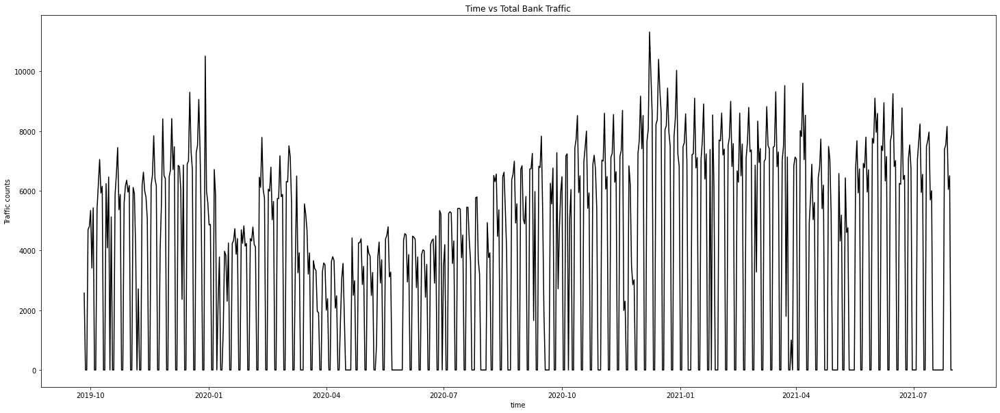

In [ ]:
plt.figure(figsize=(25,10))
plt.title('Time vs Total Bank Traffic')
plt.xlabel('time')
plt.ylabel('Traffic counts')
plt.plot(bankDataTotal['dateTime'], bankDataTotal['count']  , color='k')

In [ ]:
# Plotting the time series with no holidays 
bankDataTotalNoZero = bankDataTotal[bankDataTotal['count'] != 0 ]

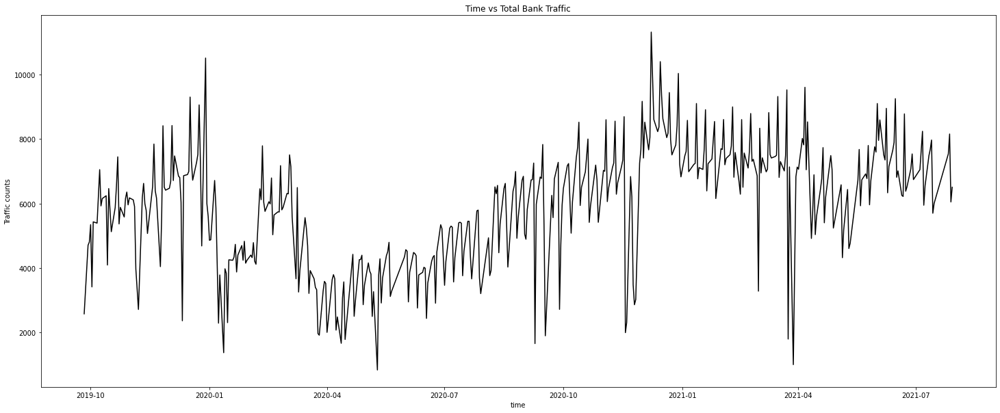

In [ ]:
plt.figure(figsize=(25,10))
plt.title('Time vs Total Bank Traffic')
plt.xlabel('time')
plt.ylabel('Traffic counts')
plt.plot(bankDataTotalNoZero['dateTime'], bankDataTotalNoZero['count']  , color='k')

## Windows Monthly Analysis 

In [ ]:
dag=bankRawData.groupby('window')

In [ ]:
t1=dag.get_group(1)

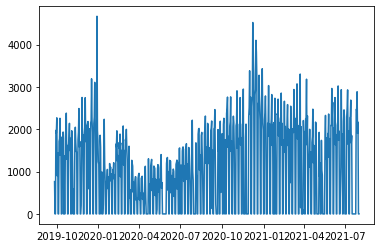

In [ ]:
plt.plot(t1['dateTime'],t1['count'])

In [ ]:
## in this cell we explored the trend using exponetial moving average
## there is a veritcal lime 1/3/2020 ---> start of covid

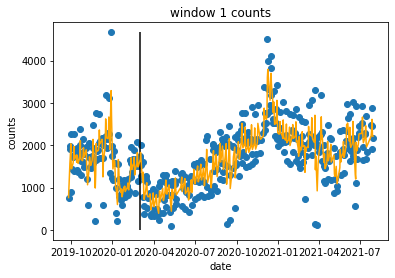

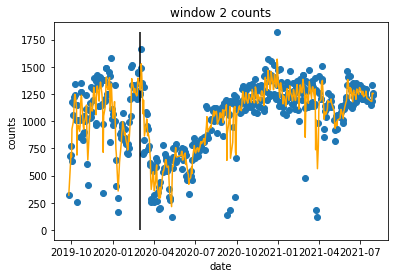

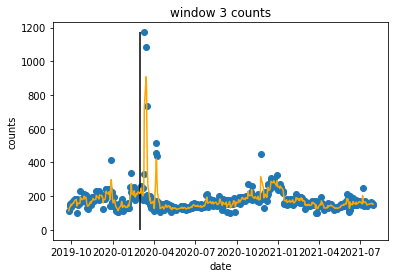

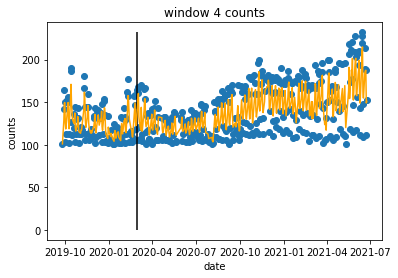

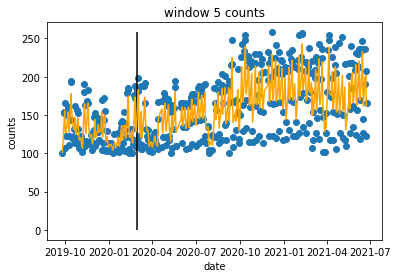

...

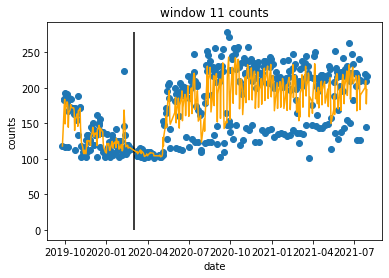

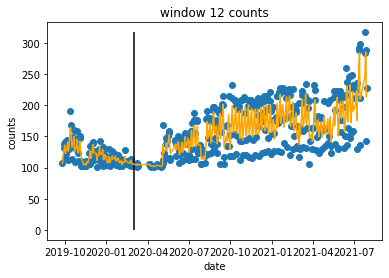

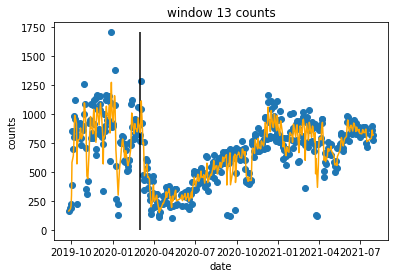

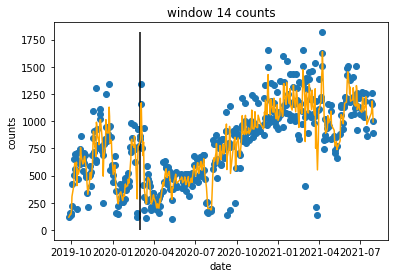

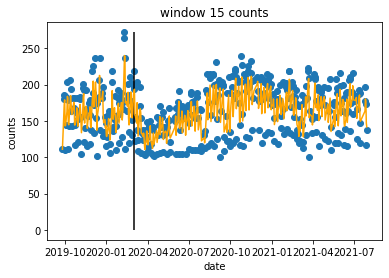

In [ ]:
for i in (dag.groups.keys()):
  temp_t=dag.get_group(i)
  temp_tp=temp_t[temp_t['count']!=0]
  plt.scatter(temp_tp['dateTime'],temp_tp['count'])
  plt.plot(temp_tp['dateTime'],temp_tp['count'].ewm(0.99).mean(),color='orange')
  plt.title(f'window {i} counts')
  plt.xlabel('date')
  plt.ylabel('counts')
  plt.vlines(pd.to_datetime('2020-03-01 02:00:00+02:00'),ymin=0,ymax=temp_t['count'].max())
  plt.show()

## Window vs WeekDay Analysis 

In [ ]:
df = bankRawData.copy()

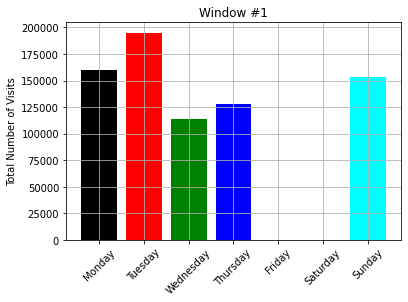

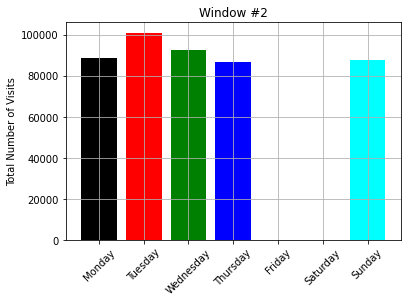

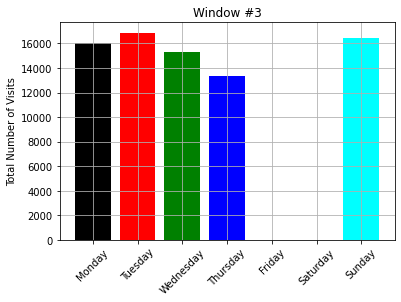

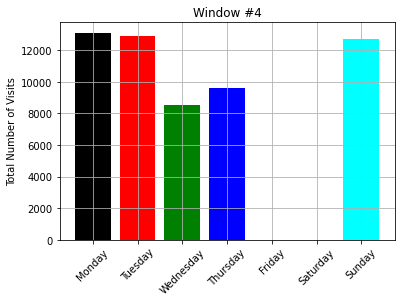

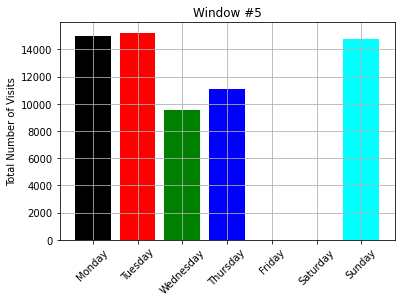

...

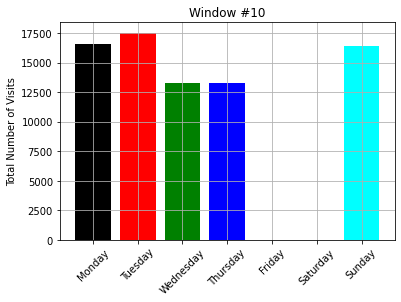

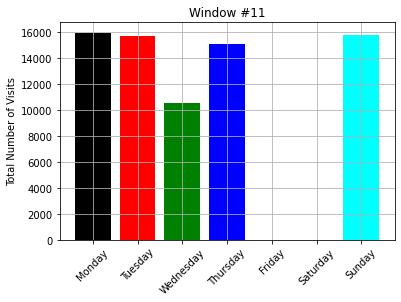

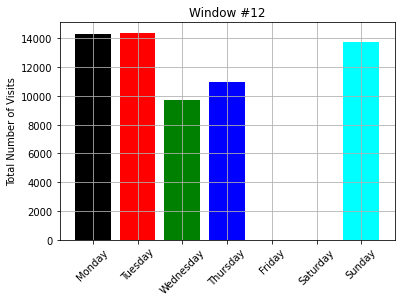

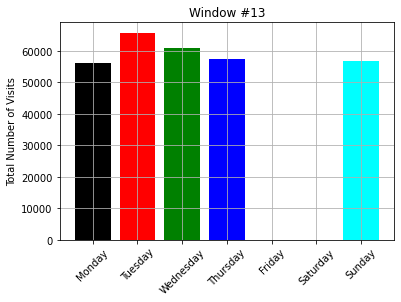

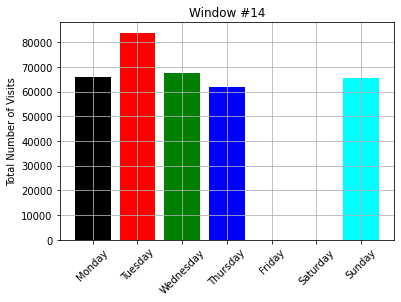

In [ ]:
for i in range(1,15 ):
  w_days = df[df["window"] == i][["count", "weekDayInt"]].groupby("weekDayInt").agg(sum)
  plt.bar(day_name[:], w_days['count'] , color=['black', 'red', 'green', 'blue', 'black', 'red', 'cyan'])
  plt.title("Window #" + str(i))
  plt.ylabel("Total Number of Visits")
  plt.xticks(rotation=45)
  plt.grid()
  plt.show()

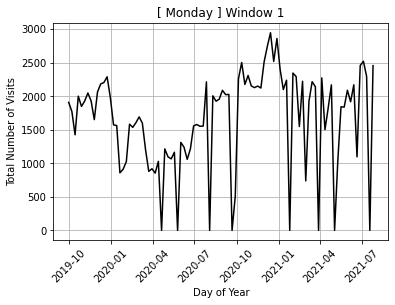

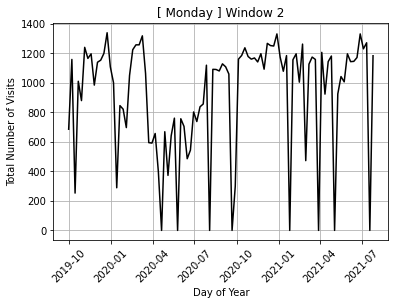

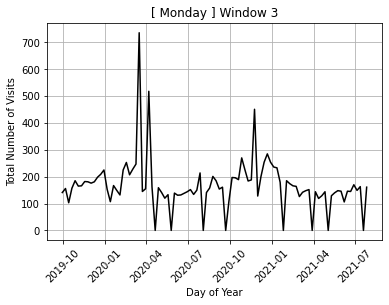

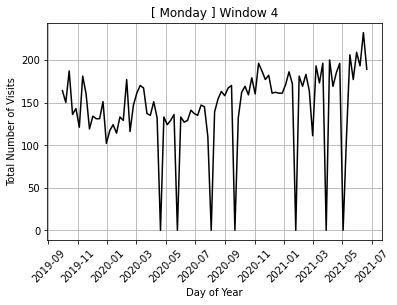

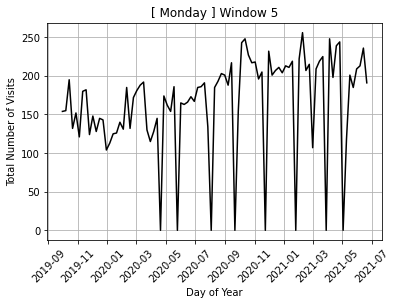

...

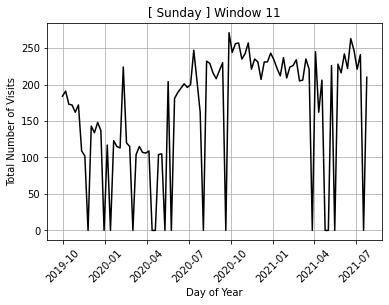

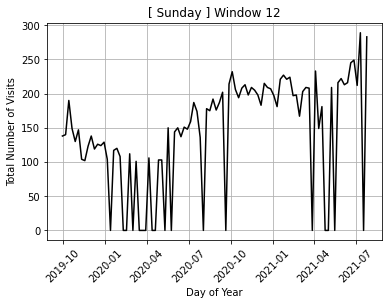

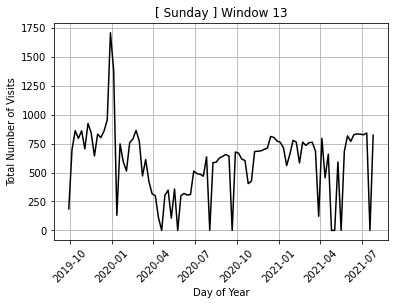

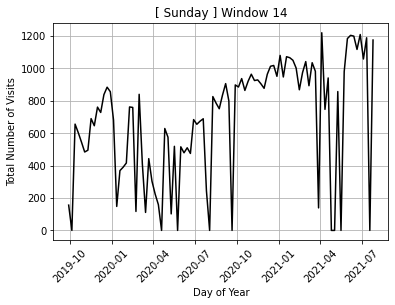

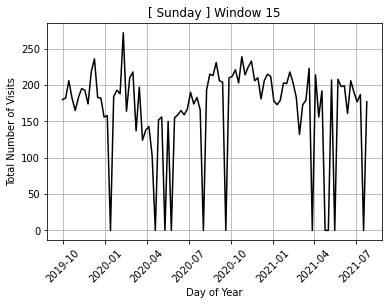

In [ ]:
for j in range(7):
  for i in range(1,16):
    day_count_all_year =  df[( df["window"] == i ) & ( df['weekDayInt'] == j ) ][["dateTime", "count"]]
    plt.plot(day_count_all_year["dateTime"], day_count_all_year["count"] , color='k')
    plt.title(f"[ {day_name[j]} ] Window {i}")
    plt.ylabel("Total Number of Visits")
    plt.grid()
    plt.xlabel("Day of Year")
    plt.xticks(rotation=45)
    plt.show()

## window vs Weekday analysis (removing 0 count days) 



In [ ]:
df_noHoliday = df[df['count'] != 0]

In [ ]:
day_name[4:6]
dayName = day_name[0:4].copy()
dayName =  dayName+ ['Sunday']

In [ ]:
w_days = df_noHoliday[df_noHoliday["window"] == 1][["count", "weekDayInt"]].groupby("weekDayInt").agg(sum)
w_days['count']

weekDayInt
0    159448
1    195013
2    113487
3    127426
6    153771
Name: count, dtype: int64

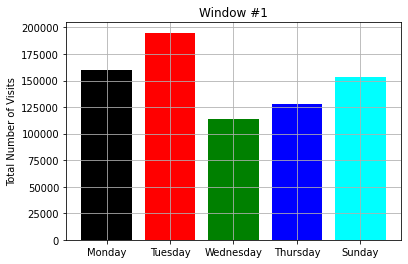

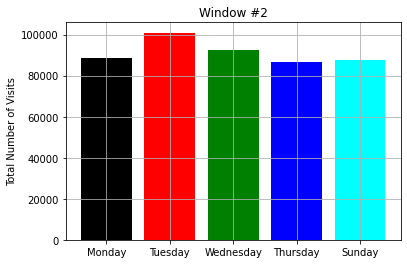

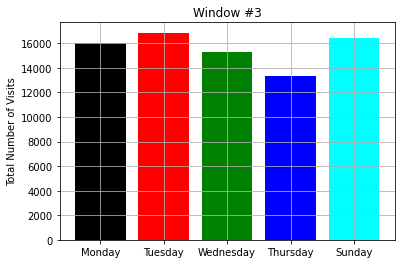

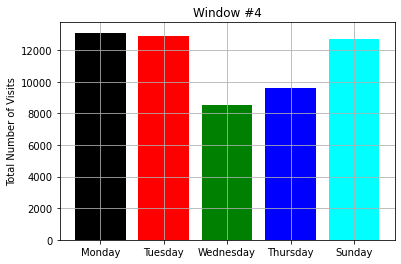

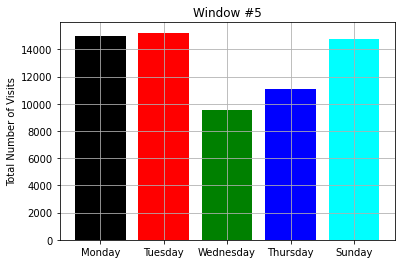

...

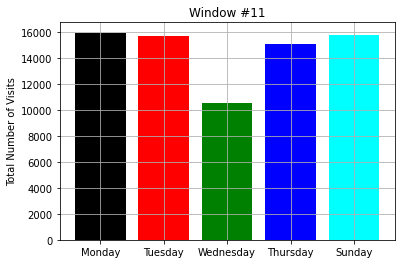

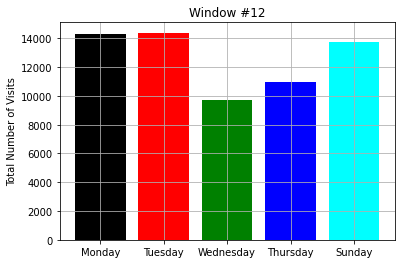

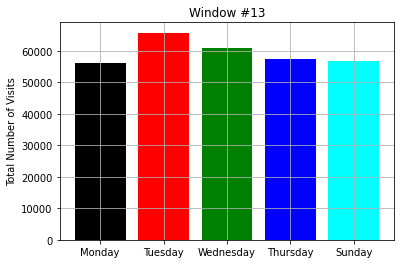

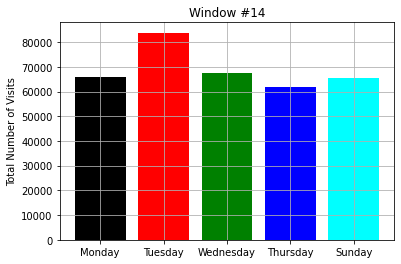

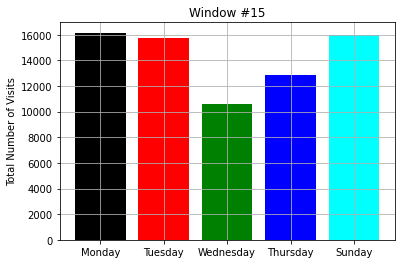

In [ ]:
# Does it make sense? 
for i in range(1,16 ):
  w_days = df_noHoliday[df_noHoliday["window"] == i][["count", "weekDayInt"]].groupby("weekDayInt").agg(sum)
  plt.bar(dayName[:], w_days['count'] , color=['black', 'red', 'green', 'blue', 'cyan'])
  plt.title("Window #" + str(i))
  plt.ylabel("Total Number of Visits")
  plt.grid()
  plt.show()

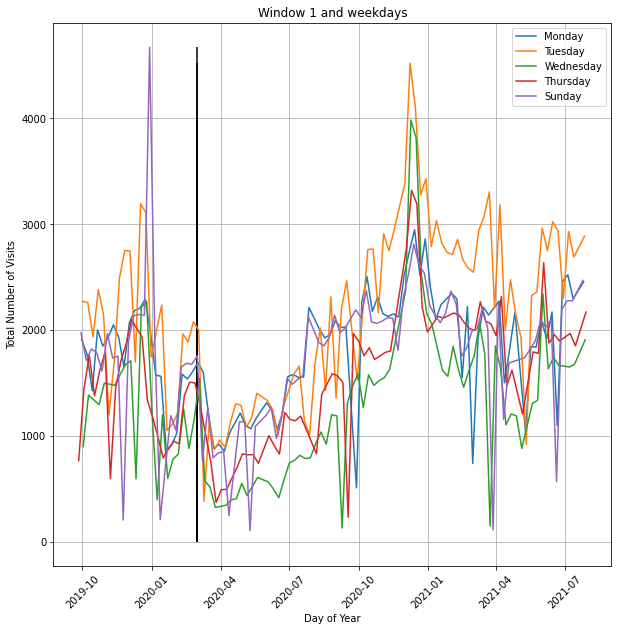

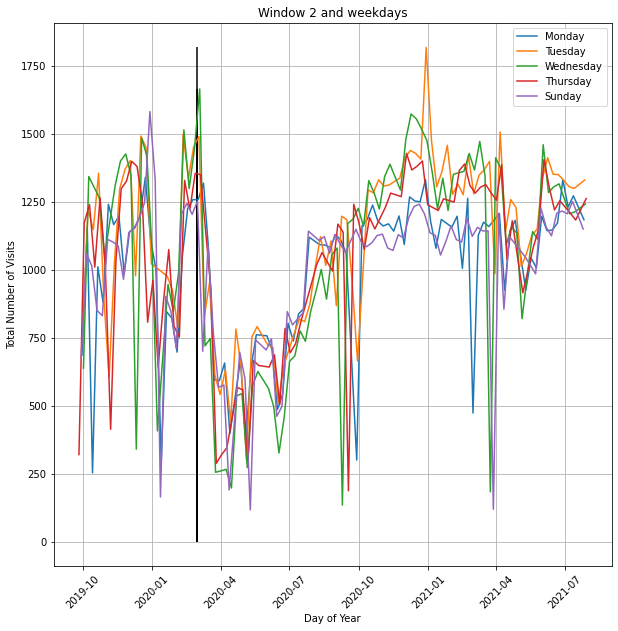

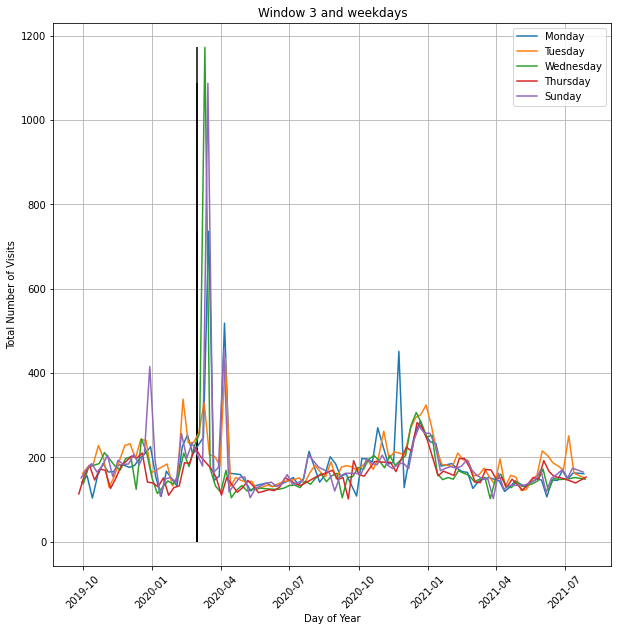

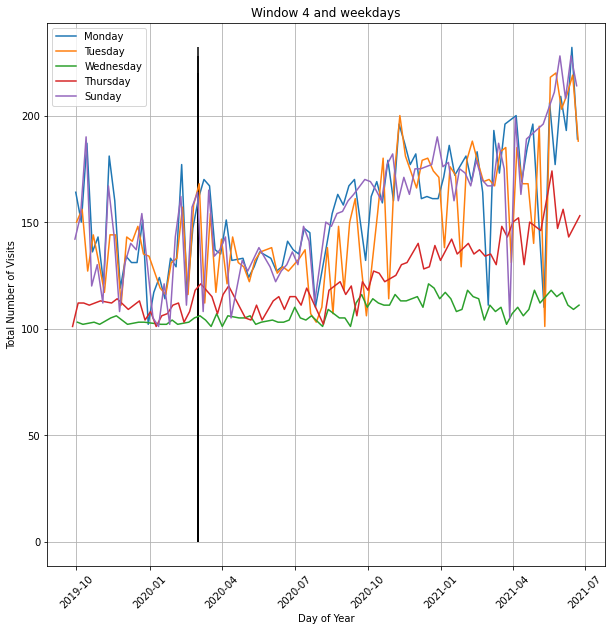

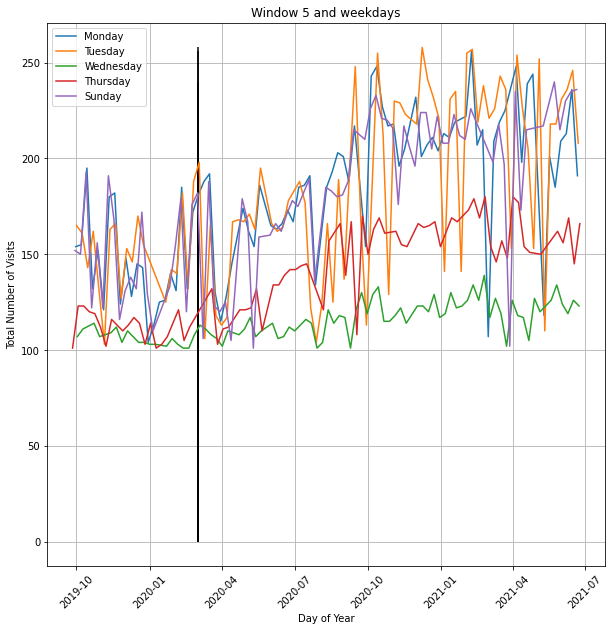

...

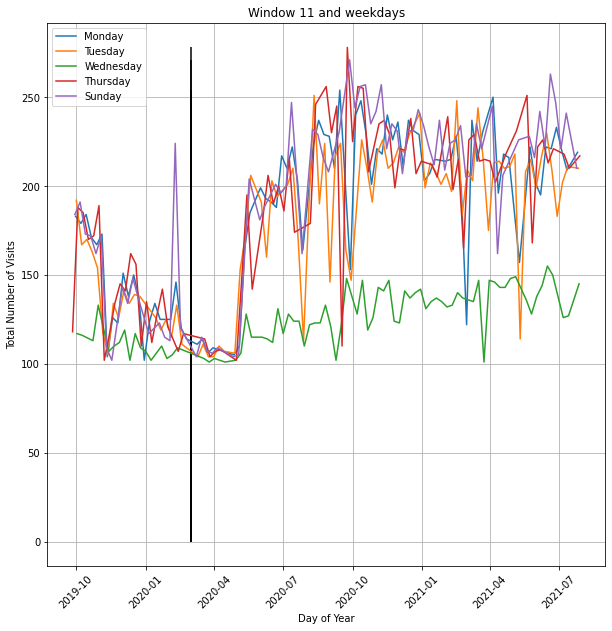

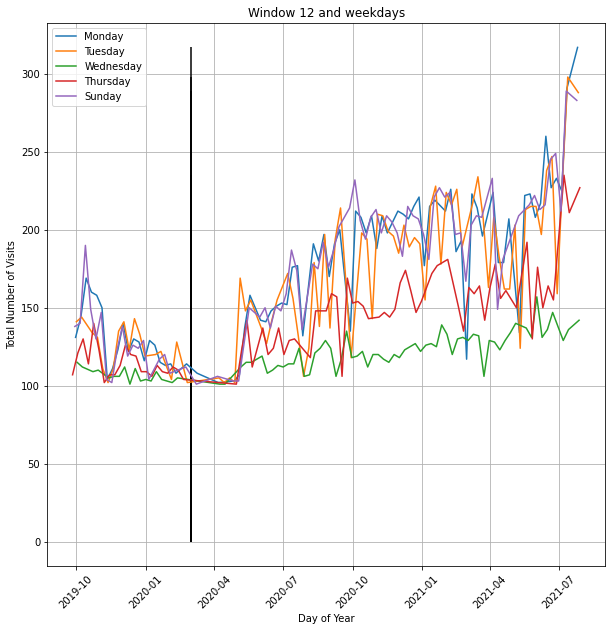

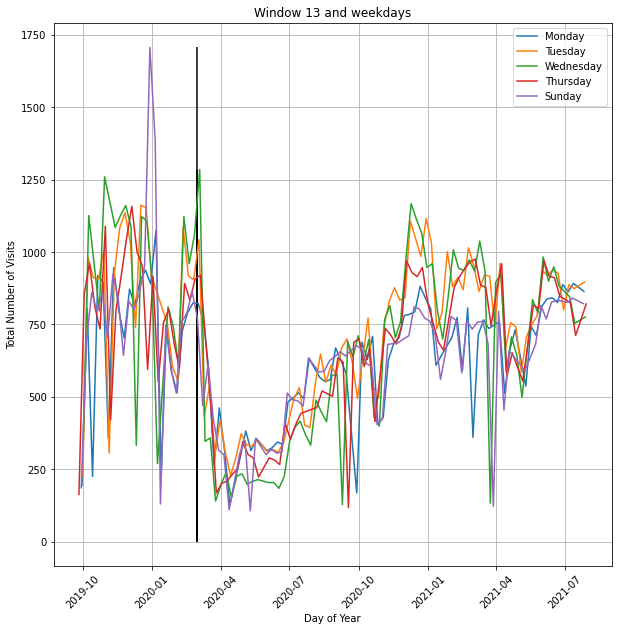

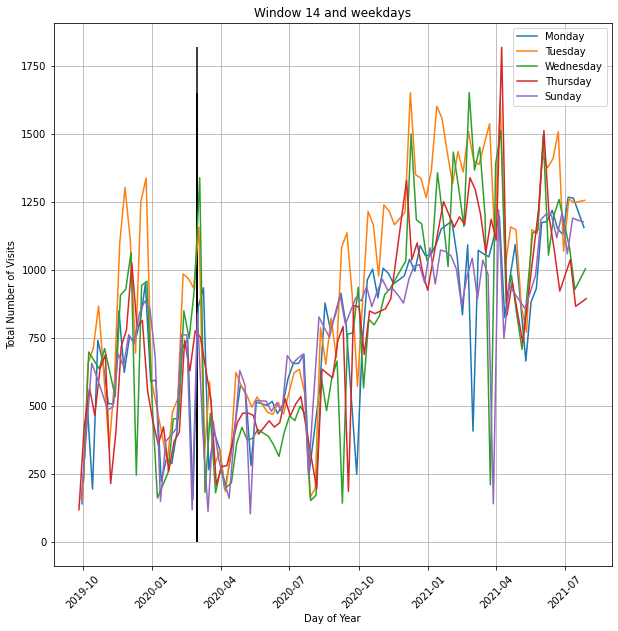

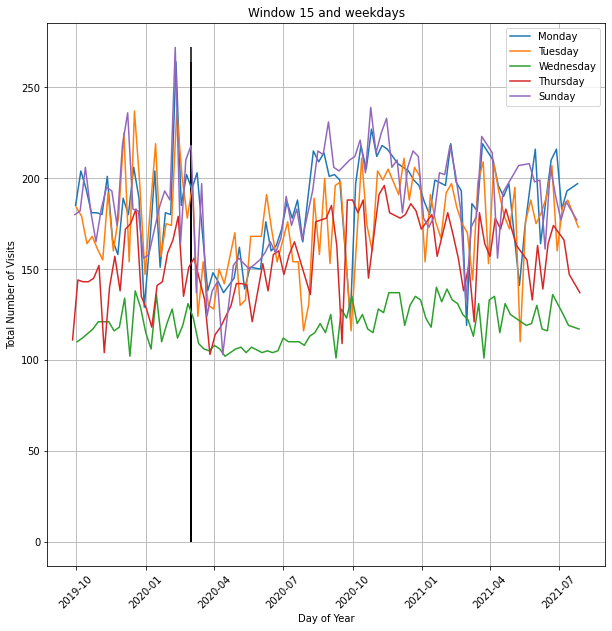

In [ ]:
days_indices = [0,1,2,3,6]
for i in range(1,16):
  plt.figure(figsize=(10,10))
  for j in days_indices:
    day_count_all_year =  df_noHoliday[( df_noHoliday["window"] == i ) & ( df_noHoliday['weekDayInt'] == j ) ][["dateTime", "count"]]
    plt.plot(day_count_all_year["dateTime"], day_count_all_year["count"] , label= day_name[j])
    plt.title(f"Window {i} and weekdays")
    plt.legend()
    plt.ylabel("Total Number of Visits")
    plt.grid()
    plt.xlabel("Day of Year")
    plt.xticks(rotation=45)
    plt.vlines(pd.to_datetime('2020-03-01 02:00:00+02:00'),ymin=0,ymax=day_count_all_year['count'].max())
  plt.show()

After analyzing the window vs Weekday trend across the timespan, we found the following insights:

- **Tuesday** has the Peak Value of Traffic in almost all windows 
- **Wednesday** has very low traffic compared to other days in almost all windows 


> More Detailed Analysis 

**For window 1**: peak: **Tuesday** , Min Traffic: **Wednesday**  </br>
**For window 2**: peak: **Tuesday** , Min Traffic: **Thursday** </br>
**For window 3**: peak: **Tuesday** , Min Traffic: **Thursday**</br>
**For window 4**: peak: **Monday** , Min Traffic: **Wednesday**</br>
**For window 5**: peak: **Tuesday** , Min Traffic: **Wednesday**</br>
**For window 6**: peak: **Monday** , Min Traffic: **Wednesday**</br>
**For window 7**: peak: **Monday** , Min Traffic: **Wednesday**</br>
**For window 8**: peak: **Tuesday** , Min Traffic: **Wednesday**</br>
**For window 9**: peak: **Tuesday** , Min Traffic: **Wednesday**</br>
**For window 10**: peak: **Tuesday** , Min Traffic: **Wednesday**</br>
**For window 11**: peak: **Tuesday** , Min Traffic: **Wednesday**</br>
**For window 12**: peak: **Tuesday** , Min Traffic: **Wednesday**</br>
**For window 13**: peak: **Tuesday** , Min Traffic: **Sunday**</br>
**For window 14**: peak: **Tuesday** , Min Traffic: **Thursday**</br>
**For window 15**: peak: **Monday** , Min Traffic: **Wednesday**</br>

## Modeling

In [ ]:
!pip install prophet

In [ ]:
!pip install darts

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from google.colab import files
from datetime import datetime
from calendar import day_name
from darts import TimeSeries
from darts.models import KalmanFilter

from darts.models import NBEATSModel, AutoARIMA, ExponentialSmoothing, Prophet, NaiveMean, NaiveDrift

from prophet import Prophet

In [ ]:
uploaded = files.upload()
for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

In [ ]:
df = pd.read_csv("bank_traffic_data.csv")

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


1 ----> 561.5174943253849


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


2 ----> 40.86870552981423


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


3 ----> 15.413052733242893


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


4 ----> 26.57933886196124


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


5 ----> 20.20895079092602


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


6 ----> 23.340203911080813


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


7 ----> 31.602716385752363


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


8 ----> 22.997412988117322


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


9 ----> 17.557064597155225


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


10 ----> 36.123110283105596


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


11 ----> 13.236943679204796


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


12 ----> 41.85162845233478


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


13 ----> 48.113799579434435


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


14 ----> 123.37107591816113
15 ----> 11.464868462788225


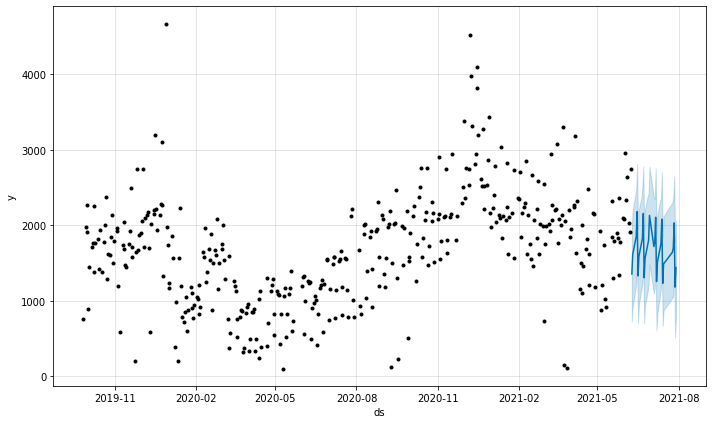

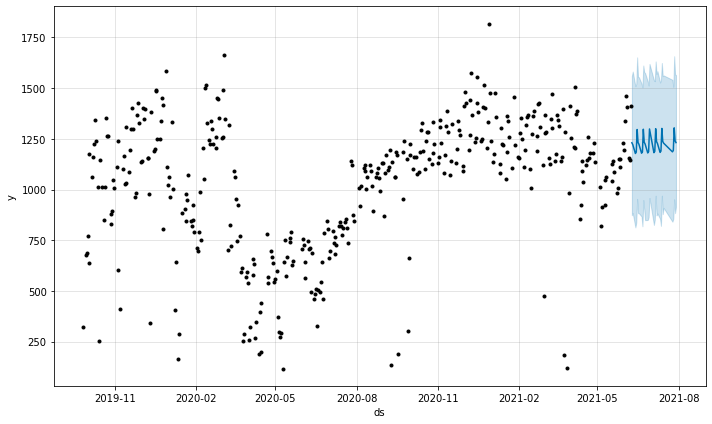

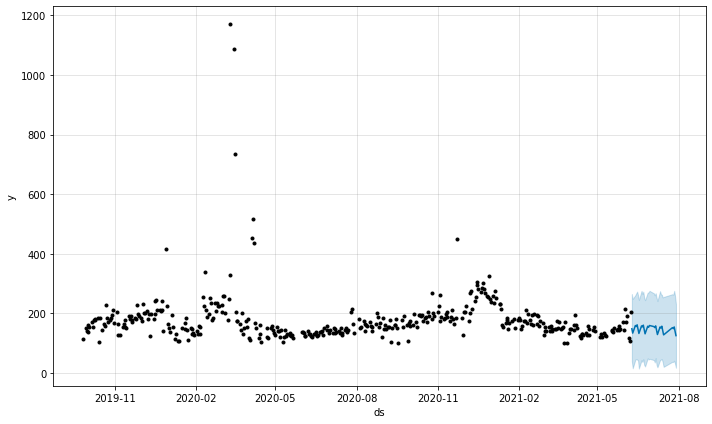

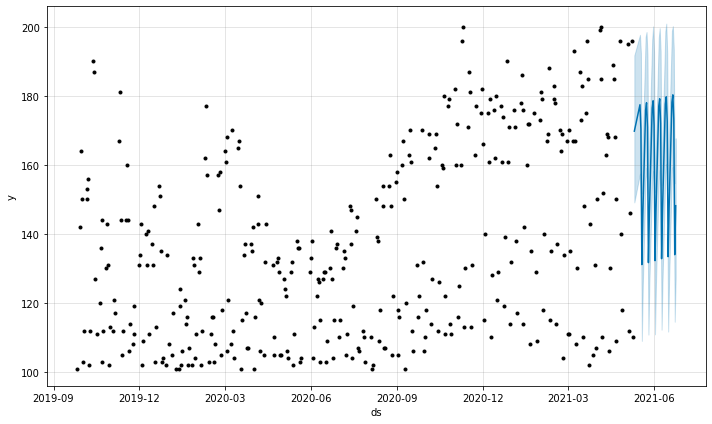

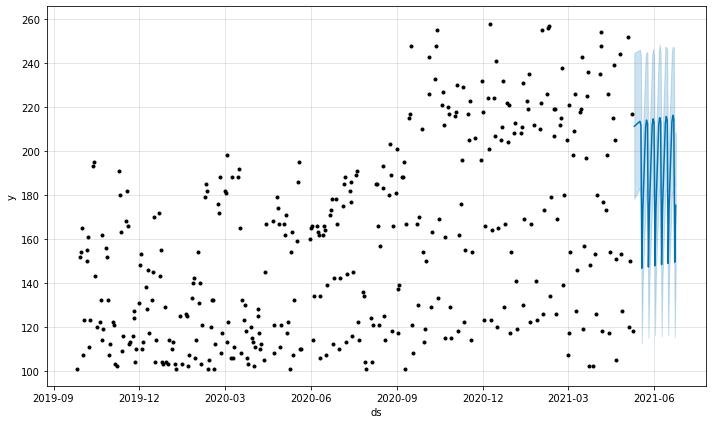

...

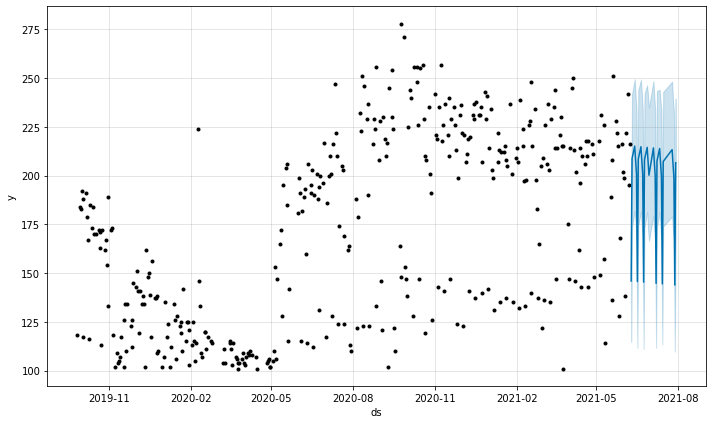

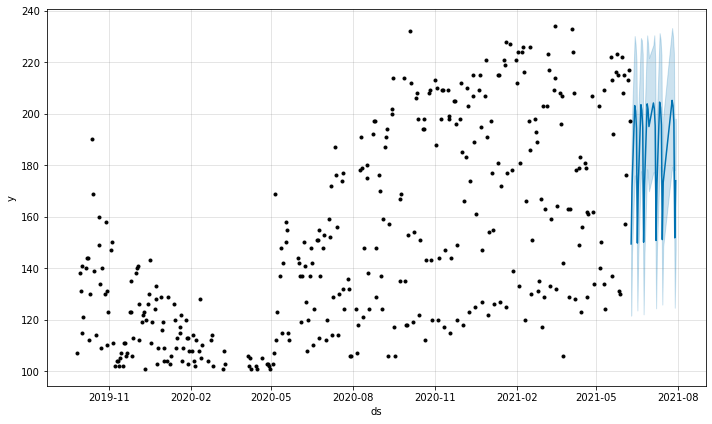

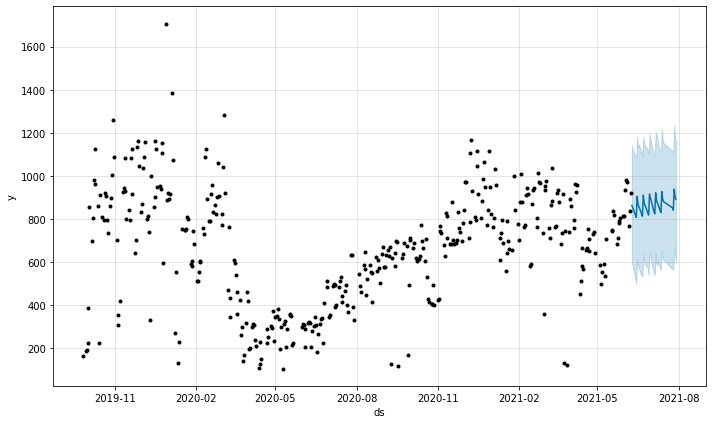

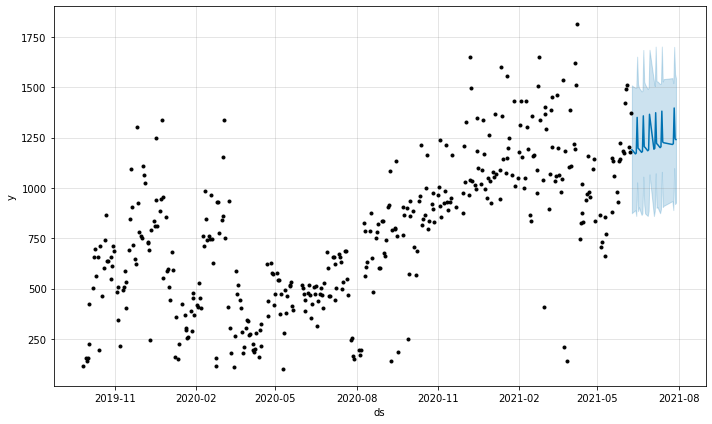

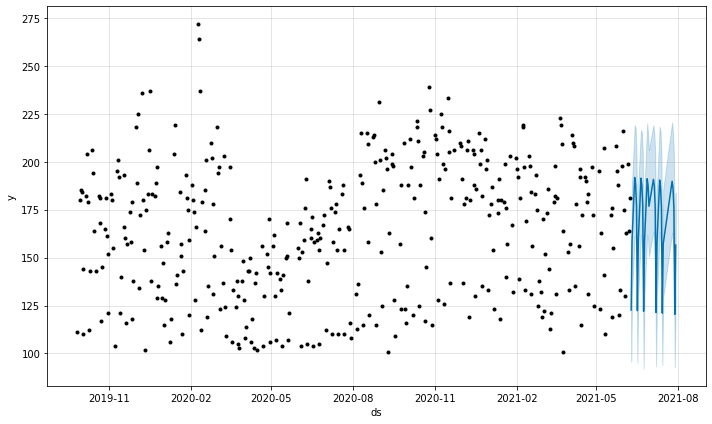

In [ ]:
for i in range(1, 16):
  df_w = df[(df["window"] == i) & (df["count"] != 0) ][["timestamp" ,"count"]]
  df_w.columns = ["ds", "y" ]
  df_w['ds'] = pd.to_datetime(df_w['ds']) 
  df_w['ds'] = df_w['ds'].apply(lambda x: x.replace(tzinfo=None))
  train = df_w.iloc[:-30]
  test = df_w.iloc[-30:]
  m = Prophet()
  m.fit(train)
  prediction = m.predict(test)
  m.plot(prediction)
  print( i , "---->",  np.mean(np.abs(np.array(prediction['yhat']) - np.array(test['y']) )))

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


1 ----> 533.2308006676444


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


2 ----> 49.913376841053136


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


3 ----> 15.303996185063902


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


4 ----> 26.370184642286084


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


5 ----> 19.820964276305364


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


6 ----> 23.489252852759666


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


7 ----> 31.50050177335557


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


8 ----> 22.977210144545293


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


9 ----> 17.074102728057206


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


10 ----> 35.61489581895093


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


11 ----> 12.69225667447123


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


12 ----> 41.923583166206974


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


13 ----> 48.835100170586415


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


14 ----> 118.48303069121167
15 ----> 11.415792899696873


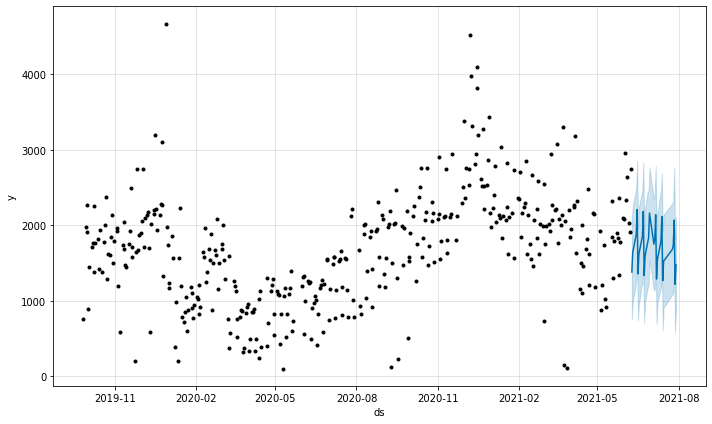

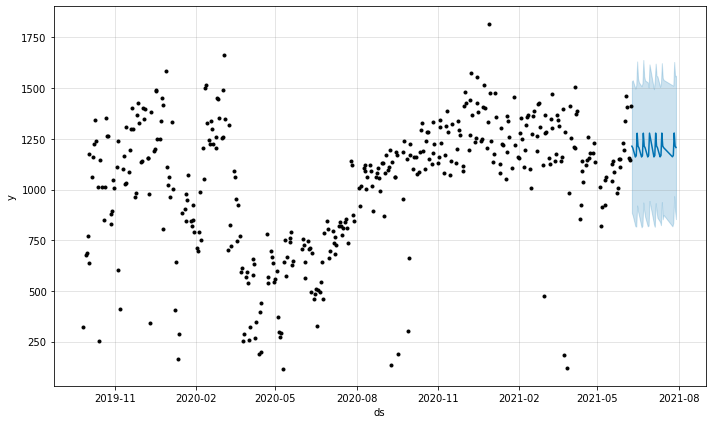

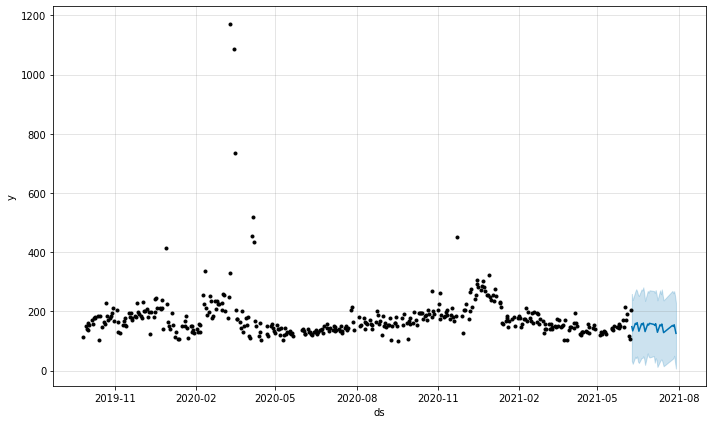

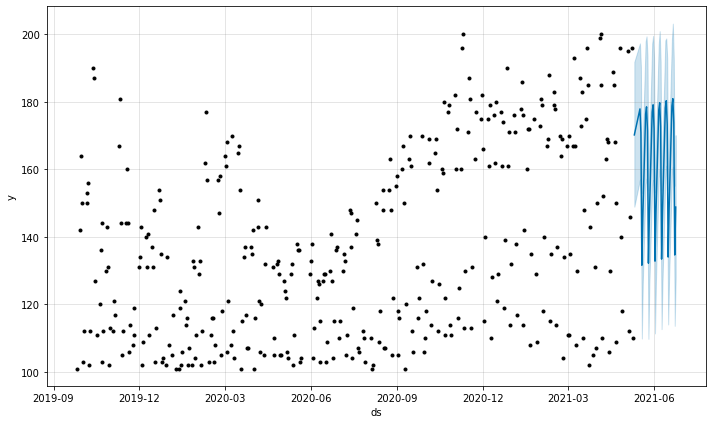

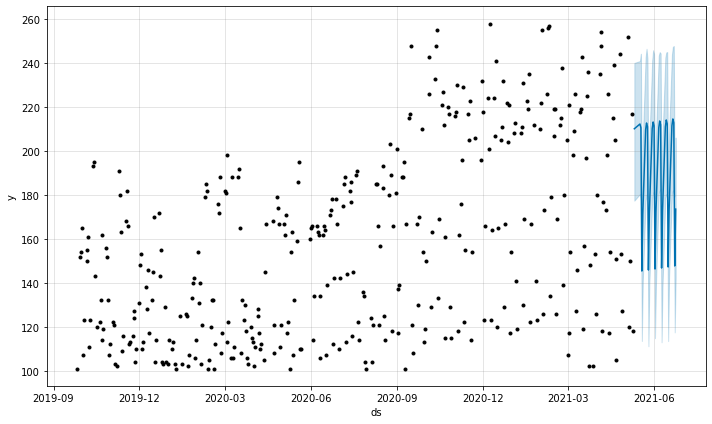

...

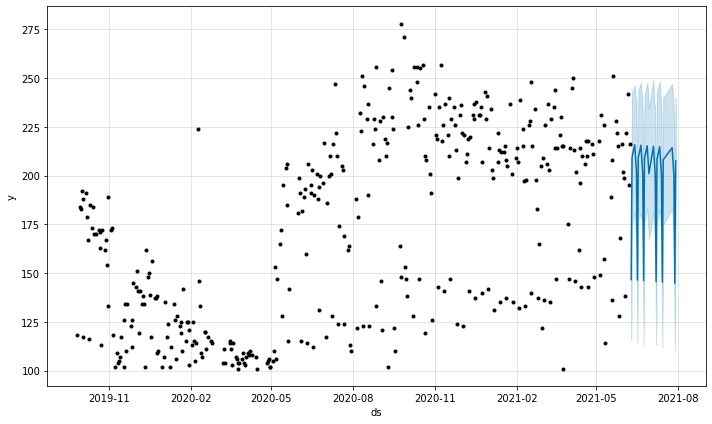

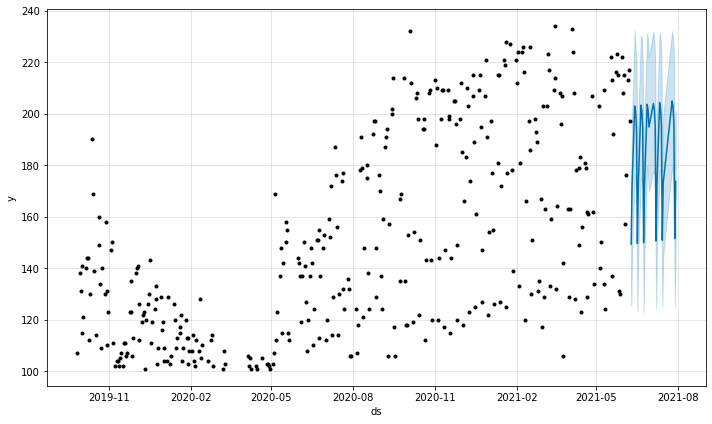

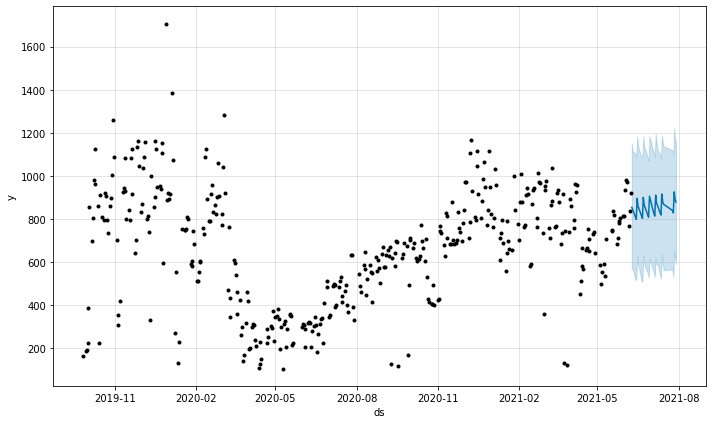

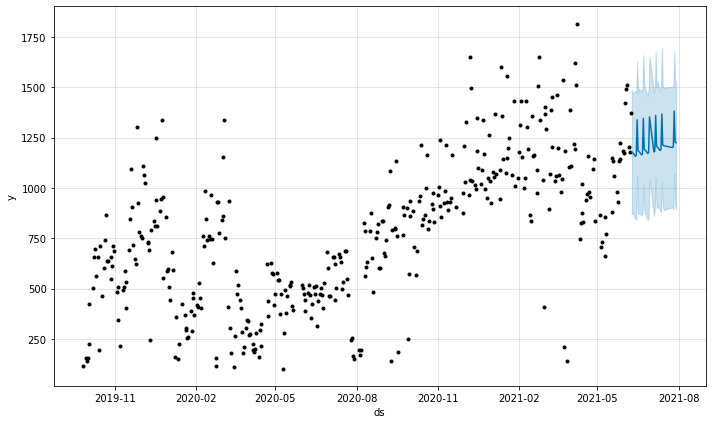

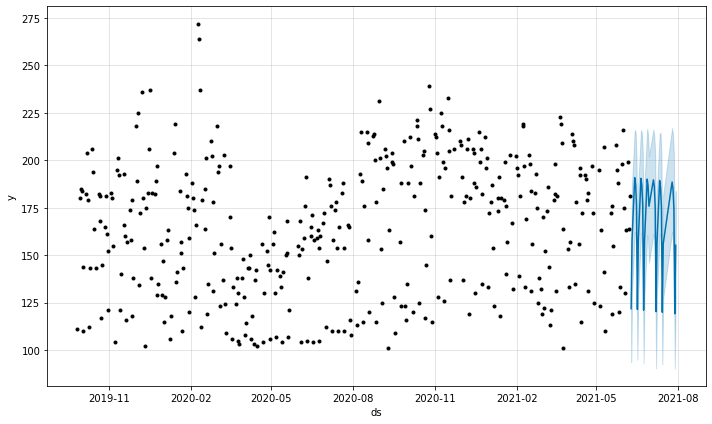

In [ ]:
for i in range(1, 16):
  df_w = df[(df["window"] == i) & (df["count"] != 0) ][["timestamp" ,"count", "weekDayInt"]]
  df_w.columns = ["ds", "y", "weekDayInt" ]
  df_w['ds'] = pd.to_datetime(df_w['ds']) 
  df_w['ds'] = df_w['ds'].apply(lambda x: x.replace(tzinfo=None))
  train = df_w.iloc[:-30]
  test = df_w.iloc[-30:]
  m = Prophet()
  m.add_regressor('weekDayInt')
  m.fit(train)
  prediction = m.predict(test)
  m.plot(prediction)
  print( i , "---->",  np.mean(np.abs(np.array(prediction['yhat']) - np.array(test['y']) )))

### Experiminting with filtering techniques:

In [ ]:
df_w = df[(df['window'] == 1) & (df['count']  != 0) ]
df_w = df_w[["timestamp" , "count"]]
df_w.columns = ["ds", "y"]

In [ ]:
df_w['ds'] = pd.to_datetime(df_w['ds']) 
df_w['ds'] = df_w['ds'].apply(lambda x: x.replace(tzinfo=None))
train = df_w.iloc[:-30]
test = df_w.iloc[-30:]

In [ ]:
train_f = KalmanFilter(P=500., R=100, Q=1).filter(TimeSeries.from_values(np.array(train['y']))).values()

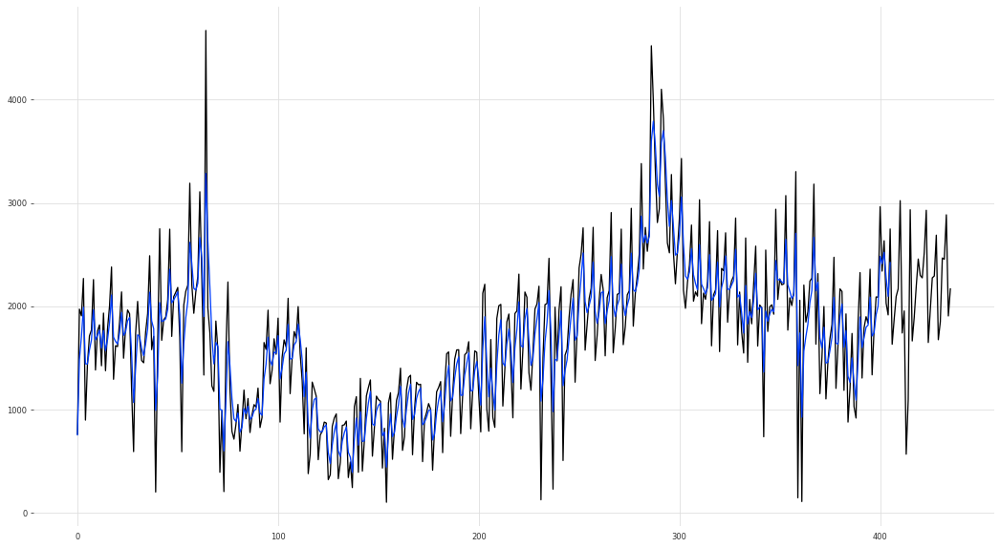

In [ ]:
plt.figure(figsize=(18,10))
plt.plot(np.array(df_w['y']))
plt.plot(train_f)

In [ ]:
train['y'] = train_f

In [ ]:
train

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


mean ---->  577.8086976302546


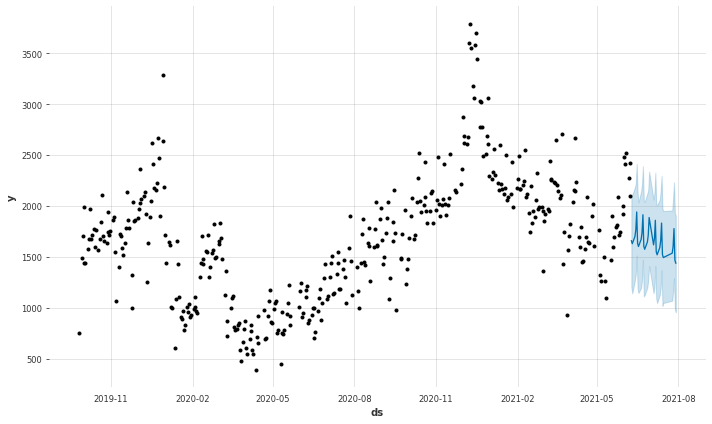

In [ ]:
m = Prophet()
m.fit(train)
prediction = m.predict(test)
m.plot(prediction)
print(  "mean ----> ",  np.mean(np.abs(np.array(prediction['yhat']) - np.array(test['y']) ))) 

### AutoARIMA Model

In [ ]:
errors = []
for i in range(1, 16):
  df_w = df[(df["window"] == i) & (df["count"] != 0) ][["timestamp" ,"count"]]
  df_w.columns = ["ds", "y" ]
  df_w['ds'] = pd.to_datetime(df_w['ds']) 
  df_w['ds'] = df_w['ds'].apply(lambda x: x.replace(tzinfo=None))
  train, test = df_w.iloc[157:-30], df_w.iloc[-30:]
  model = AutoARIMA()
  model.fit(TimeSeries.from_values(np.array(train['y'])))
  prediction = model.predict(30)
  error = np.mean(np.abs(model.predict(30).values().ravel() - np.array(test['y']) ))
  errors.append(error)
  print( i , "---->",  error)
print (f"sum = {sum(errors)}")

1 ----> 409.140719936004
2 ----> 54.56542897153864
3 ----> 14.702498349949968
4 ----> 44.25286898577466
5 ----> 43.66410374709723
6 ----> 38.94042522546569
7 ----> 49.08061197655249
8 ----> 42.72750241406792
9 ----> 23.39054468335126
10 ----> 27.143297518680473
11 ----> 27.476824880776384
12 ----> 54.418066074876535
13 ----> 41.34629659363498
14 ----> 147.38158676858237
15 ----> 24.176754967648336
sum = 1042.407531094001


### Exponential Smoothing

In [ ]:
print ('expon smoothing')
errors = []
for i in range(1, 16):
  df_w = df[(df["window"] == i) & (df["count"] != 0) ][["timestamp" ,"count"]]
  df_w.columns = ["ds", "y" ]
  df_w['ds'] = pd.to_datetime(df_w['ds']) 
  df_w['ds'] = df_w['ds'].apply(lambda x: x.replace(tzinfo=None))
  train, test = df_w.iloc[157:-30], df_w.iloc[-30:]
  model = ExponentialSmoothing()
  model.fit(TimeSeries.from_values(np.array(train['y'])))
  prediction = model.predict(30)
  error = np.mean(np.abs(model.predict(30).values().ravel() - np.array(test['y']) ))
  errors.append(error)
  print( i , "---->",  error)
print (f"sum = {sum(errors)}")

expon smoothing
1 ----> 451.6021304322554
2 ----> 125.04033539407169
3 ----> 15.001531277645796
4 ----> 44.056448264201016
5 ----> 41.53541348465941
6 ----> 50.59944014052588
7 ----> 57.44266253409771
8 ----> 46.55876688315722
9 ----> 30.002609360321234
10 ----> 34.67025588315859
11 ----> 32.663193438716334
12 ----> 56.94690812329715
13 ----> 66.35614146947356
14 ----> 192.33316306929106
15 ----> 25.88359445922871
sum = 1270.6925942141008


In [ ]:
### this model is after removing the data before covid 
### all models perfomed better after removing them/

In [ ]:
errors = []
for i in range(1, 16):
  df_w = df[(df["window"] == i) & (df["count"] != 0) ][["timestamp" ,"count"]]
  df_w.columns = ["ds", "y" ]
  df_w['ds'] = pd.to_datetime(df_w['ds']) 
  df_w['ds'] = df_w['ds'].apply(lambda x: x.replace(tzinfo=None))
  train = df_w.iloc[157:-30]
  test = df_w.iloc[-30:]
  m = Prophet(daily_seasonality=True, yearly_seasonality=True)
  m.fit(train)
  prediction = m.predict(test)
  error = np.mean(np.abs(prediction['yhat'] - np.array(test['y']) ))
  errors.append(error)
  print( i , "---->",  error)
print (f"sum = {sum(errors)}")

1 ----> 627.6669317588335
2 ----> 315.4356701178567
3 ----> 40.95729081027264
4 ----> 32.46044250916598
5 ----> 24.55387875610468
6 ----> 48.677474077064254
7 ----> 58.33437609410148
8 ----> 50.63138688968893
9 ----> 33.02394526455562
10 ----> 65.97623476924335
11 ----> 54.33645345102561
12 ----> 75.987469901357
13 ----> 233.65147928449412
14 ----> 309.28739425911425
15 ----> 35.579798202921786
sum = 2006.5602261458


In [ ]:
test

,ds,y,prd
9983,2021-07-02 02:00:00,0,6.429641
9984,2021-07-03 02:00:00,0,6.730529
9985,2021-07-04 02:00:00,177,170.865580
9986,2021-07-05 02:00:00,183,172.103931
9987,2021-07-06 02:00:00,184,170.513808
9988,2021-07-07 02:00:00,125,121.211515
9989,2021-07-08 02:00:00,166,139.029728
9990,2021-07-09 02:00:00,0,10.299252
9991,2021-07-10 02:00:00,0,10.845171
9992,2021-07-11 02:00:00,187,174.992847


In [ ]:
df_count =  df.groupby('timestamp', as_index=False).agg(sum)[['timestamp', 'count']]

In [ ]:
df_count.columns

Index(['timestamp', 'count'], dtype='object')

### Models without accounting for individual Windows

In [ ]:
  df_w = df_count
  df_w.columns = ["ds", "y" ]
  df_w['ds'] = pd.to_datetime(df_w['ds']) 
  df_w['ds'] = df_w['ds'].apply(lambda x: x.replace(tzinfo=None))
  train, test = df_w.iloc[:-30], df_w.iloc[-30:]
  model = AutoARIMA()
  model.fit(TimeSeries.from_values(np.array(train['y'])))
  prediction = model.predict(30)
  print(  " mean ---->",  np.mean(np.abs(model.predict(30).values().ravel() - np.array(test['y']) )))

 mean ----> 3118.56171875385


In [ ]:
holidays_2021 = ['2021-01-07',
 '2021-01-28',
 '2021-04-29',
 '2021-05-01',
 '2021-05-02',
 '2021-05-03',
 '2021-05-12',
 '2021-05-13',
 '2021-05-14',
 '2021-05-15',
 '2021-05-16',
 '2021-07-01',
 '2021-07-17',
 '2021-07-18',
 '2021-07-19',
 '2021-07-20',
 '2021-07-21',
 '2021-07-22',
 '2021-07-23',
 '2021-07-24',
 '2021-08-12',
 '2021-10-07',
 '2021-10-21']


In [ ]:
def gen_col():
  arr = []

  for i in range(1, 16):
    arr.append(str(i))
  return arr

### Deep Learning Models

In [ ]:
import tensorflow as tf
keras=tf.keras

In [ ]:
## Read data to experiment independently
data=pd.read_csv('/content/drive/MyDrive/GO AI Hackathon/bank_traffic_data.csv')
data['timestamp']=pd.to_datetime(data['timestamp'])
dag=data.groupby('window')
X,y=dag.get_group(13)['timestamp'],dag.get_group(13)['count']
X=((X-pd.to_datetime('2019-09-26 02:00:00+02:00')).astype(np.int)/(86400000000000)).values

# start after covid ... better results after exp

X_train,X_test=X[157:-30],X[-30-wind_size:] 
y_train,y_test=y[157:-30],y[-30-wind_size:]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.



In [ ]:
# slice dataset for Convs
def window_dataset(series, window_size, batch_size=1):
    series = tf.expand_dims(series, axis=-1)

    dataset = tf.data.Dataset.from_tensor_slices(series)
    dataset = dataset.window(window_size + 1, shift=1, drop_remainder=True)
    dataset = dataset.flat_map(lambda window: window.batch(window_size + 1))
    dataset = dataset.map(lambda window: (window[:-1], window[-1]))
    dataset = dataset.batch(batch_size).prefetch(1)
    return dataset

In [ ]:
# !pip install darts

In [ ]:
from darts import TimeSeries
from darts.models import KalmanFilter


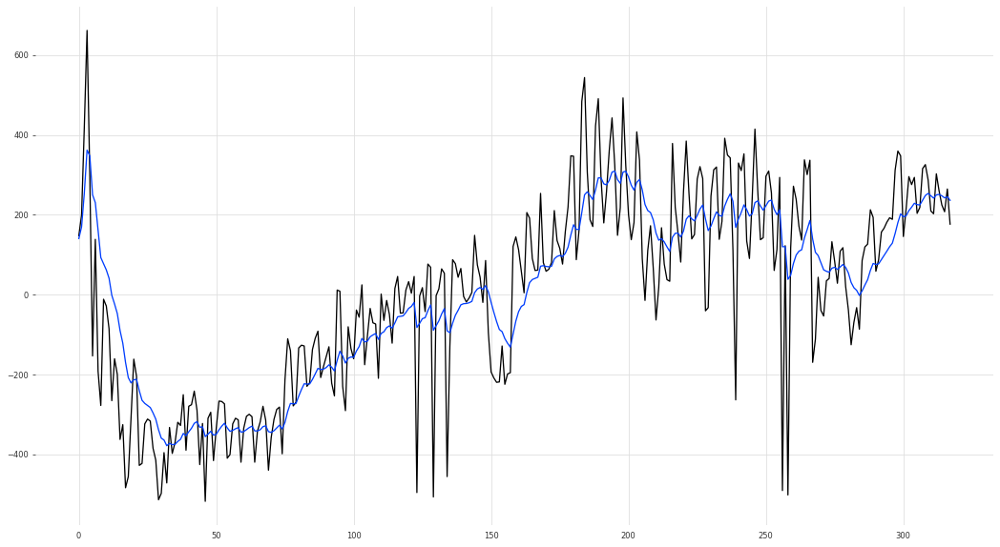

In [ ]:
# Smooth data using kalman filter
df_w = y_train
y_nz=y_train[y_train!=0]
y_m=y_nz.mean()
filtered_v = KalmanFilter(P=1000., R=50, Q=1).filter(TimeSeries.from_values(np.array(y_train[y_train!=0]-y_m))).values()
plt.figure(figsize=(18,10))
plt.plot(np.array(y_train[y_train!=0]-y_m))
plt.plot(filtered_v)

In [ ]:
class ResetStatesCallback(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs):
        self.model.reset_states()

keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

wind_size = 7
b_size=32
y_t=filtered_v.ravel()

# M,m=y_t.max(),y_t.min()

# y_t=y_t-y_t.mean()

data=window_dataset(y_t,wind_size,batch_size=b_size) # dataset


In [ ]:
# adapted from https://colab.research.google.com/github/tensorflow/examples/blob/master/courses/udacity_intro_to_tensorflow_for_deep_learning
model = keras.models.Sequential()
model.add(keras.layers.InputLayer(input_shape=[None, 1]))
for dilation_rate in (1, 2, 4,8):
    model.add(
      keras.layers.Conv1D(filters=32,
                          kernel_size=7,
                          strides=1,
                          dilation_rate=dilation_rate,
                          padding="causal",
                          activation="relu")
    )
model.add(keras.layers.Conv1D(filters=1, kernel_size=1))
lr_schedule = keras.callbacks.LearningRateScheduler(
    lambda epoch: 1e-4 * 10**(epoch / 30))
optimizer = keras.optimizers.Adam()
model.compile(loss=keras.losses.Huber(),
              optimizer=optimizer,
              metrics=["mae"])
history = model.fit(data, epochs=30,)

Epoch 1/30
10/10 [==============================] - 1s 10ms/step - loss: 174.6992 - mae: 175.1991
Epoch 2/30
10/10 [==============================] - 0s 8ms/step - loss: 172.6116 - mae: 173.1115
Epoch 3/30
10/10 [==============================] - 0s 9ms/step - loss: 168.7737 - mae: 169.2737
Epoch 4/30
10/10 [==============================] - 0s 8ms/step - loss: 159.4827 - mae: 159.9826
Epoch 5/30
10/10 [==============================] - 0s 8ms/step - loss: 139.3809 - mae: 139.8806
Epoch 6/30
10/10 [==============================] - 0s 10ms/step - loss: 109.2363 - mae: 109.7355
Epoch 7/30
10/10 [==============================] - 0s 8ms/step - loss: 92.4936 - mae: 92.9923
Epoch 8/30
10/10 [==============================] - 0s 8ms/step - loss: 100.8126 - mae: 101.3108
Epoch 9/30
10/10 [==============================] - 0s 9ms/step - loss: 91.0051 - mae: 91.5037
Epoch 10/30
10/10 [==============================] - 0s 8ms/step - loss: 70.0651 - mae: 70.5635
Epoch 11/30
10/10 [==============

In [ ]:
# model.save('cnn_win_13.h5')

In [ ]:
def plot_series(time, series, format="-", start=0, end=None, label=None):
    plt.plot(time[start:end], series[start:end], format, label=label)
    plt.xlabel("Time")
    plt.ylabel("Value")
    if label:
        plt.legend(fontsize=14)
    plt.grid(True)
    
def trend(time, slope=0):
    return slope * time
  

In [ ]:

def model_forecast(model, series, window_size):
    
    ds = tf.data.Dataset.from_tensor_slices(series)
    ds = ds.window(window_size, shift=1, drop_remainder=True)
    ds = ds.flat_map(lambda w: w.batch(window_size))
    ds = ds.batch(1).prefetch(1)
    for x in ds:
      print(x.numpy().shape)
      break
    forecast = model.predict(ds)
    return forecast

In [ ]:
# iteratively get the predictions of the cnn model

last_wind=y_train[y_train!=0][-wind_size:][:,np.newaxis]
preds=[]
for i in range(y_test[y_test!=0].shape[0]): # Exclude holidays
  
  out=model_forecast(model,last_wind[-wind_size:],wind_size)[:,0]
  preds.append(out)
  last_wind=np.append(last_wind,out,axis=0)



In [ ]:
mask=y_test!=0

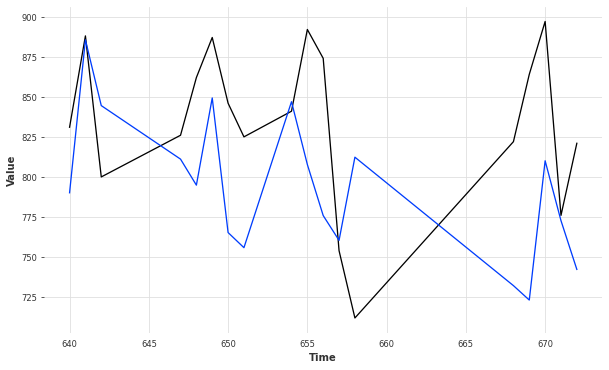

In [ ]:
plt.figure(figsize=(10, 6))
plot_series(X_test[mask], y_test[mask])
plot_series(X_test[mask], preds)

In [ ]:
keras.metrics.mean_absolute_error(y_test[mask],preds).numpy()

58.441284

In [ ]:
#### Conclusion
#***The CNN Model performs quite well on the tellers 1 and 13, but it's not the best models***

### Selected Model 
>> using Prophet --> produced the best results

In [ ]:
test = pd.read_csv('template.csv')

In [ ]:
test['timestamp'] =pd.to_datetime(test['timestamp'])

In [ ]:
errors = []
predictions = []
test.columns = ['ds']
for i in range(1, 16):
  df_w = df[(df["window"] == i)][["timestamp" ,"count"]]
  df_w.columns = ["ds", "y" ]
  df_w['ds'] = pd.to_datetime(df_w['ds']) 
  df_w['ds'] = df_w['ds'].apply(lambda x: x.replace(tzinfo=None))
  train = df_w
  m = Prophet(daily_seasonality=True, yearly_seasonality=True)
  m.fit(train)
  prediction = m.predict(test)
  predictions.append(prediction['yhat'])
  #error = np.mean(np.abs(prediction['yhat'] - np.array(test['y']) ))
  #errors.append(np.array(error))
  #print( i , "---->",  error)
#print (f"sum = {sum(errors)}")

In [ ]:
windows_predictions = pd.DataFrame(predictions).T
windows_predictions.columns = gen_col()

In [ ]:
windows_predictions

In [ ]:
windows_predictions['ds'] = np.array(test['ds'])

In [ ]:
windows_predictions['weekDayInt'] = windows_predictions['ds'].apply(lambda x: x.dayofweek) # Monday Day 0 

In [ ]:
windows_predictions['isOfficial'] = windows_predictions['ds'].apply ( lambda x : x.date()). apply ( lambda x : 1 if (x in holidays_2021) else  0 )

In [ ]:
for i in range(len(windows_predictions)):
  if( windows_predictions.at[i, 'weekDayInt'] == 4 or windows_predictions.at[i,'weekDayInt'] == 5 ):
    windows_predictions.at[i, 'isOfficial'] = 1
  else:
    windows_predictions.at[i, 'isOfficial'] = 0

In [ ]:
for i in range(len(test)):
  if (windows_predictions.iloc[i]['isOfficial']):
    for j in range(1, 16):
      windows_predictions.at[i, str(j)] = 0

## Exporting Prediction

In [ ]:
windows_predictions['count'] = windows_predictions[gen_col()].sum(axis=1)

In [ ]:
submit = windows_predictions[['ds', 'count']]

In [ ]:
submit.columns = ['timestamp', 'count']

In [ ]:
submit['count']= np.ceil(submit['count']).astype(int)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
submit

,timestamp,count
0,2021-08-01 02:00:00,5696
1,2021-08-02 02:00:00,5842
2,2021-08-03 02:00:00,6708
3,2021-08-04 02:00:00,5059
4,2021-08-05 02:00:00,5231
5,2021-08-06 02:00:00,0
6,2021-08-07 02:00:00,0
7,2021-08-08 02:00:00,6252
8,2021-08-09 02:00:00,6454
9,2021-08-10 02:00:00,7370


In [ ]:
submit.to_csv('bank_prediction.csv', index = False)